# ☁️ Cloud group members:
- Safuan IUSUPOV
- Shodai FUJIMOTO
- Dorsa MOTIALLAH
- Darkhan ISLAM
- Hadjer BRIOUA


# Project Summary

1.   📚 Retrieval-Augmented Generation (RAG) Dataset 12000
2.   📗 Embedding Analysis Overview (Word2Vec)
3.   📕 Semantic analysis of dataset (by Sentence Transformer)
4.   📙 Semantic analysis (by LLM embeddings)
5.   🤖 Classical NLP approach
6.   📐 RAG Metrics
7.   🧾 Prompt Engineering with Gemini 2.0 Flash
8.   🚂 LLMs in RAG and their Fine-Tuning
9.   📘 Summarization Model with LoRA and PEFT using FLAN-T5
10.  🎙️ Voice Interactive Chatbot (Offline LLM + Contextual RAG) 🦙



# 📚 [Retrieval-Augmented Generation (RAG) Dataset 12000](https://huggingface.co/datasets/neural-bridge/rag-dataset-12000)

Retrieval-Augmented Generation (RAG) Dataset 12000 is an English dataset designed for RAG-optimized models, built by [Neural Bridge AI](https://www.neuralbridge.ai/), and released under [Apache license 2.0](https://www.apache.org/licenses/LICENSE-2.0.html).

## Dataset Description


### Dataset Summary

Retrieval-Augmented Generation (RAG) enhances large language models (LLMs) by allowing them to consult an external authoritative knowledge base before generating responses. This approach significantly boosts the models' ability to produce relevant, accurate, and context-specific output by extending their capabilities to specialized domains or an organization's internal data, without the need for retraining. RAG offers a cost-effective method to leverage the vast data processing power of LLMs, equipped with billions of parameters, for tasks such as question-answering, language translation, and sentence completion, ensuring that the output is always up-to-date and applicable to various contexts.

RAG's importance lies in its potential to address the inherent challenges of LLMs, such as unpredictability in responses, reliance on static and potentially outdated training data, and the risk of disseminating incorrect or non-authoritative information. These issues can negatively affect user trust in AI-powered applications, making RAG's ability to guide LLMs toward authoritative sources for information retrieval invaluable.

RAG has multiple benefits, including cost-effective implementation and maintenance, access to current information, improved user trust through accurate information and source attribution, and greater control for developers over the information retrieval process. This approach allows for the dynamic updating of LLMs with the latest research, statistics, or news, directly addressing the challenges of maintaining relevancy and accuracy in rapidly changing knowledge landscapes. Additionally, it empowers organizations to deploy generative AI more confidently across a wider range of applications, enhancing both the user experience and the reliability of AI-driven interactions.

Retrieval-Augmented Generation (RAG) Dataset 12000 dataset is a triple-feature collection, with each entry containing a "context", "question", and "answer" fields, designed to help build RAG-optimized models. This data consists of 12000 entries, and the context data is from [Falcon RefinedWeb](https://huggingface.co/datasets/tiiuae/falcon-refinedweb).

### Dataset Structure

- **Languages**: English (`en`)
- **Size**: 12,000 entries
- **Splits**:
  - Train: 9,600 examples
  - Test: 2,400 examples
- **Fields**:
  - `context`: A string consisting of a range of tokens.
  - `question`: A string consisting of a question related to the context.
  - `answer`: A string consisting of an answer for the question.

Each data point comprises a context obtained from Falcon RefinedWeb, a question about the context, and an answer for the question. The question and answer for each data point are generated by GPT-4.

### License

This dataset is released under the Apache 2.0 license. Users should also abide by the Falcon RefinedWeb Terms of Use.



# 📗 Embedding Analysis Overview (Word2Vec)

This notebook explores various techniques for analyzing textual data through word embeddings. The key components include:

- **Word2Vec**: To generate vector representations of words based on their context.
- **t-SNE**: For dimensionality reduction and visualization of high-dimensional embeddings in 2D space.
- **Cosine Similarity**: To measure the semantic similarity between `context`, `question`, and `answer` fields.
- **K-Means Clustering**: To group semantically similar text samples based on their embeddings.

The goal is to understand semantic patterns in the dataset by embedding, comparing, and clustering natural language components.

## 1. Load the Dataset and Perform Exploratory Data Analysis (EDA)

We begin by loading the dataset, which contains natural language fields such as `context`, `question`, and `answer`.  
Basic exploratory data analysis (EDA) is performed to understand the structure, size, and content of the data.  
This includes checking column names, missing values, and a preview of sample entries.

In [ ]:
import pandas as pd
import numpy as np
import re

In [ ]:
pd.set_option('display.max_colwidth', None)

In [ ]:
splits = {'train': 'data/train-00000-of-00001-9df3a936e1f63191.parquet', 'test': 'data/test-00000-of-00001-af2a9f454ad1b8a3.parquet'}
df = pd.read_parquet("hf://datasets/neural-bridge/rag-dataset-12000/" + splits["train"])

In [ ]:
df.shape

(9600, 3)

In [ ]:
df.columns

Index(['context', 'question', 'answer'], dtype='object')

"The RAG dataset 12 000" contains 9600 samples of context question and answer

## 2. Data Preprocessing

To prepare the text data for embedding, we apply several preprocessing steps:

- **Email and URL removal**: Strip out any email addresses and hyperlinks using regular expressions.
- **Punctuation removal**: Clean text from punctuation symbols.
- **Lowercasing**: Standardize all text to lowercase for consistency.
- **Tokenization**: Split text into individual words using NLTK's `RegexpTokenizer`.
- **Stopword removal**: Eliminate common English stopwords (e.g., "the", "and", "is") using NLTK.
- **Missing value removal**: Drop rows that contain missing (`NaN`) entries to ensure data integrity.

These transformations are applied to the `context`, `question`, and `answer` fields of the dataset.


In [ ]:
def remove_emails_urls(text):
    if isinstance(text, str):
        text = re.sub(r"\b[\w.-]+@[\w.-]+\.\w+\b", "", text)         # emails
        text = re.sub(r"http\S+|www\.\S+", "", text)                # urls
    return text

In [ ]:
df = df.applymap(remove_emails_urls)

C:\Users\User\AppData\Local\Temp\ipykernel_12180\1707929082.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(remove_emails_urls)


In [ ]:
df = df.applymap(lambda x: re.sub(r"[^\w\s@]", " ", x) if isinstance(x, str) else x)
df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)
df = df.applymap(lambda x: re.sub(r"\n", " ", x) if isinstance(x, str) else x)

C:\Users\User\AppData\Local\Temp\ipykernel_12180\1710537768.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: re.sub(r"[^\w\s@]", " ", x) if isinstance(x, str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_12180\1710537768.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_12180\1710537768.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: re.sub(r"\n", " ", x) if isinstance(x, str) else x)


In [ ]:
df.dropna(subset=["question", "answer"], inplace=True)

In [ ]:
df.shape

(9598, 3)

After dropping rows with missing values, the dataset now contains **9,598** rows and **3** columns.

In [ ]:
from nltk.tokenize import RegexpTokenizer

tokenizer = RegexpTokenizer(r'\w+')
df_1 = df.applymap(lambda x: tokenizer.tokenize(x.lower()) if isinstance(x, str) else x)

C:\Users\User\AppData\Local\Temp\ipykernel_12180\4187045613.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_1 = df.applymap(lambda x: tokenizer.tokenize(x.lower()) if isinstance(x, str) else x)


The default set of English stopwords from `nltk` does not include some common **auxiliary** and **modal verbs**, which may reduce noise when removed.  
To enhance the stopword filtering step, we extend the stopword list with a custom set:

```python
custom_words = {'would', 'could', 'should', 'shall', 'may', 'might', 'must', 'also'}

In [ ]:
from nltk.corpus import stopwords

stop_words = set(stopwords.words('english'))
custom_words = {'would', 'could', 'should', 'shall', 'may', 'might', 'must', 'also'}

# Add them to stopwords set
stop_words.update(custom_words)
df_1 = df_1.applymap(lambda x: [word for word in x if word not in stop_words])

C:\Users\User\AppData\Local\Temp\ipykernel_12180\3889552032.py:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_1 = df_1.applymap(lambda x: [word for word in x if word not in stop_words])


In [ ]:
df_1 = df_1.applymap(lambda x: [word for word in x if not re.search(r'\d', word)] if isinstance(x, list) else x)

C:\Users\User\AppData\Local\Temp\ipykernel_12180\2948061708.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_1 = df_1.applymap(lambda x: [word for word in x if not re.search(r'\d', word)] if isinstance(x, list) else x)


In [ ]:
number_words = {
    'zero', 'one', 'two', 'three', 'four', 'five',
    'six', 'seven', 'eight', 'nine', 'ten',
    'eleven', 'twelve', 'thirteen', 'fourteen', 'fifteen',
    'sixteen', 'seventeen', 'eighteen', 'nineteen', 'twenty',
    'thirty', 'forty', 'fifty', 'sixty', 'seventy', 'eighty', 'ninety',
    'hundred', 'thousand', 'million', 'billion', 'trillion'
}

In the exploratory analysis, **number words** (e.g., "one", "two", "hundred", "thousand") were found to be among the top 10 most frequent tokens in the corpus.

Since these tokens are semantically weak and may introduce **distributional bias** into the embedding space, we explicitly remove them during preprocessing.

```python
number_words = {
    'zero', 'one', 'two', 'three', 'four', 'five',
    'six', 'seven', 'eight', 'nine', 'ten',
    'eleven', 'twelve', 'thirteen', 'fourteen', 'fifteen',
    'sixteen', 'seventeen', 'eighteen', 'nineteen', 'twenty',
    'thirty', 'forty', 'fifty', 'sixty', 'seventy', 'eighty', 'ninety',
    'hundred', 'thousand', 'million', 'billion', 'trillion'
}

In [ ]:
df_1 = df_1.applymap(lambda x: [word for word in x if word.lower() not in number_words] if isinstance(x, list) else x)

C:\Users\User\AppData\Local\Temp\ipykernel_12180\245220940.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_1 = df_1.applymap(lambda x: [word for word in x if word.lower() not in number_words] if isinstance(x, list) else x)


In [ ]:
from itertools  import chain
flat_corpus = list(chain.from_iterable(corpus))
from nltk import FreqDist
# Create frequency distribution
fdist = FreqDist(flat_corpus)

In [ ]:
# Get most common words
print("Most common words:")
for word, count in fdist.most_common(10):
    print(f"{word}: {count}")

Most common words:
time: 11385
new: 11031
like: 10683
get: 9227
people: 8301
said: 7923
first: 7664
make: 7249
year: 6940
well: 6638


The top 10 most frequent words in the corpus include polysemous terms like **"like"** and **"well"**, which can function as verbs, adverbs, or adjectives depending on the context.

This ambiguity highlights a limitation of traditional Word2Vec, which generates a single embedding per word regardless of context.

To address this, one potential improvement is to use **Part-of-Speech (POS) tagging** to disambiguate word roles before embedding. For example, we can use `nltk.pos_tag` to annotate each token, enabling the model to learn distinct embeddings for, say, "like_VB" (verb) and "like_IN" (preposition).

We plan to compare the performance of:
- Standard Word2Vec (context-independent)
- Word2Vec trained on POS-tagged data (context-aware)

This will help evaluate whether syntactic context improves embedding quality.

In [ ]:
from collections import Counter
from itertools import chain

tokens = list(chain.from_iterable(df_1['context'].tolist()))
Counter(tokens).most_common(10)

[('time', 10823),
 ('like', 10169),
 ('new', 9893),
 ('get', 8956),
 ('said', 7878),
 ('people', 7767),
 ('first', 6972),
 ('make', 6829),
 ('year', 6465),
 ('well', 6417)]

In [ ]:
from collections import Counter
from itertools import chain

tokens = list(chain.from_iterable(df_tagged['context'].tolist()))
Counter(tokens).most_common(10)

[('time_NN', 10823),
 ('like_IN', 10024),
 ('new_JJ', 9893),
 ('said_VBD', 7878),
 ('people_NNS', 7767),
 ('year_NN', 6465),
 ('us_PRP', 6300),
 ('well_RB', 6242),
 ('good_JJ', 5908),
 ('many_JJ', 5641)]

Here we see that as predicted top 10 words were changed.

In [ ]:
import nltk
nltk.download('averaged_perceptron_tagger_eng')

[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger_eng.zip.


True

In [ ]:
from nltk import pos_tag
def tag_tokens(tokens):
    if isinstance(tokens, list):
        return [f"{word}_{tag}" for word, tag in pos_tag(tokens)]
    return tokens

In [ ]:
df_tagged = df_1.applymap(tag_tokens)

C:\Users\User\AppData\Local\Temp\ipykernel_12180\776080613.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tagged = df_1.applymap(tag_tokens)


In [ ]:
corpus = df_1.context.dropna().tolist() + df_1.question.dropna().tolist() + df_1.answer.dropna().tolist()

In [ ]:
corpus_tagged = df_tagged.context.dropna().tolist() + df_tagged.question.dropna().tolist() + df_tagged.answer.dropna().tolist()

These two sets will be used for further analysis:
 - corpus
 - corpus_tagged

## 3. Word2Vec Embedding

To capture the semantic meaning of words in the corpus, we train a **Word2Vec** model using the preprocessed tokens.

Word2Vec learns dense vector representations for words by leveraging their co-occurrence patterns in a context window.  
We use the **Skip-gram** architecture, which predicts surrounding context words from a target word. This is particularly effective for capturing relationships involving rare words.

### Model Configuration:
- `vector_size = 100`: Dimensionality of the word vectors
- `window = 5`: Maximum distance between the current and predicted word within a sentence
- `min_count = 2`: Ignores all words with total frequency lower than this
- `sg = 1`: Use the Skip-gram model (if set to 0, uses CBOW)
- `workers = 4`: Number of threads used for training


The resulting embeddings will later be used for similarity analysis and clustering tasks.


In [ ]:
from gensim.models.word2vec import Word2Vec

model = Word2Vec(sentences=corpus, vector_size=100, window=5, min_count = 2, workers = 4, sg=1)

In [ ]:
model.save('word2vec_sg1_v3.model')

In [ ]:
model_tagged = Word2Vec(sentences=corpus_tagged, vector_size=100, window=5, min_count = 2, workers = 4, sg=1)

In [ ]:
model_tagged.save('word2vec_sg1_tagged_v1.model')

## 4. Embedding Analysis using t-SNE Visualization

We apply t-SNE to a subset of the learned word embeddings and plot them to visually explore the semantic structure.


In [ ]:
model = Word2Vec.load('word2vec_sg1_v3.model')

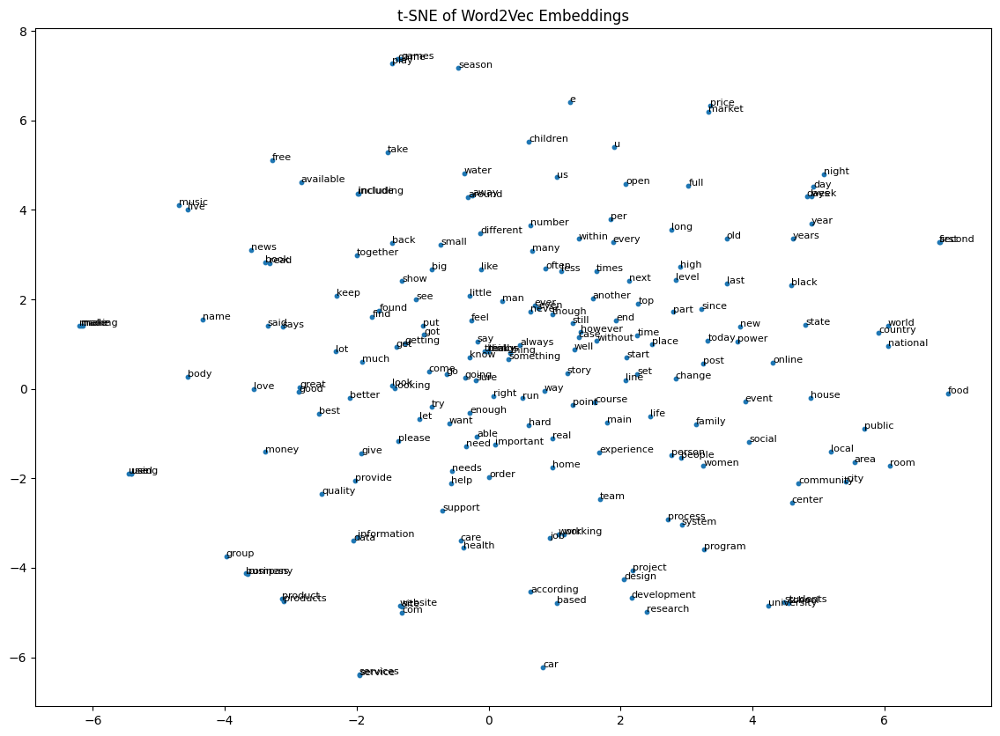

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

words = list(model.wv.index_to_key[:200])  # top 300 words
X = model.wv[words]
X_emb = TSNE(n_components=2, random_state=42).fit_transform(X)

plt.figure(figsize=(14, 10))
plt.scatter(X_emb[:, 0], X_emb[:, 1], s=10)
for i, word in enumerate(words):
    plt.text(X_emb[i, 0], X_emb[i, 1], word, fontsize=8)
plt.title("t-SNE of Word2Vec Embeddings")
plt.show()

In [ ]:
model.wv.similarity('export', 'trade')

0.60798717

In [ ]:
model.wv.most_similar('regulation')

[('mandates', 0.8310936689376831),
 ('mandated', 0.8298096060752869),
 ('stricter', 0.8283527493476868),
 ('regulators', 0.8209963440895081),
 ('conformity', 0.8163638710975647),
 ('antitrust', 0.8111076951026917),
 ('indirect', 0.7950779795646667),
 ('violating', 0.789936900138855),
 ('governed', 0.7881536483764648),
 ('statutory', 0.7880648970603943)]

In [ ]:
model.wv.doesnt_match(['banana', 'apple', 'grape', 'truck'])

'truck'

Model has properly learning semantic relations between words like **"regulation"**, **"mandates"**, and **"statutory"**  which appear closely clustered in vector space. Also, it correctly detected the word **"truck"** that is not fruit.

In [ ]:
model_tagged = Word2Vec.load('word2vec_sg1_tagged_v1.model')

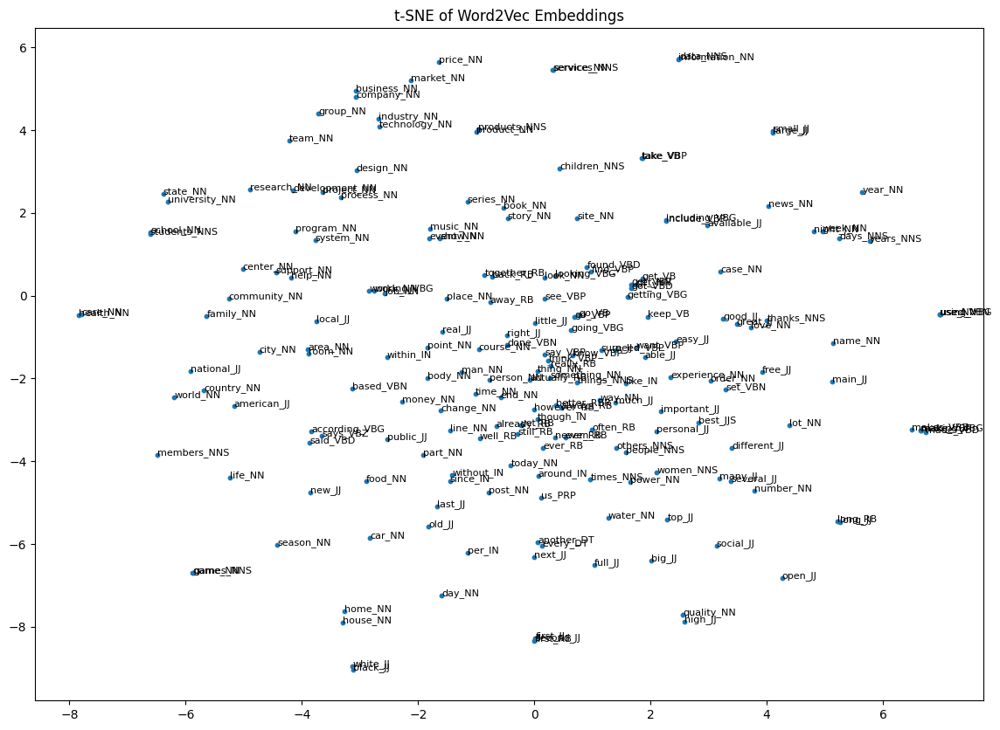

In [ ]:
words = list(model_tagged.wv.index_to_key[:200])  # top 300 words
X = model_tagged.wv[words]
X_emb = TSNE(n_components=2, random_state=42).fit_transform(X)

plt.figure(figsize=(14, 10))
plt.scatter(X_emb[:, 0], X_emb[:, 1], s=10)
for i, word in enumerate(words):
    plt.text(X_emb[i, 0], X_emb[i, 1], word, fontsize=8)
plt.title("t-SNE of Word2Vec Embeddings")
plt.show()

After applying POS tagging and training Word2Vec on the tagged data, we visualized the embeddings using t-SNE.

We observed that:
- **Most frequent words are nouns**, which are broadly dispersed across the embedding space.
- **Verbs tend to cluster** in a distinct region (notably overlapping on the right side of the plot).

In [ ]:
model_tagged.wv.similarity('export_NN', 'trade_NN')

0.65609473

In [ ]:
model.wv.most_similar('regulation')

[('mandates', 0.8310936689376831),
 ('mandated', 0.8298096060752869),
 ('stricter', 0.8283527493476868),
 ('regulators', 0.8209963440895081),
 ('conformity', 0.8163638710975647),
 ('antitrust', 0.8111076951026917),
 ('indirect', 0.7950779795646667),
 ('violating', 0.789936900138855),
 ('governed', 0.7881536483764648),
 ('statutory', 0.7880648970603943)]

In [ ]:
model_tagged.wv.most_similar('regulation_NN')

[('regulatory_JJ', 0.8462827801704407),
 ('regulators_NNS', 0.832422137260437),
 ('epa_NN', 0.8266862034797668),
 ('purchaser_NN', 0.8253569006919861),
 ('stricter_NN', 0.8190826773643494),
 ('mandated_VBD', 0.8189629912376404),
 ('compliance_NN', 0.818800151348114),
 ('complying_VBG', 0.8145252466201782),
 ('antitrust_JJ', 0.8115417957305908),
 ('taxation_NN', 0.8098549246788025)]

The results from the POS-tagged Word2Vec model show semantically relevant and syntactically consistent neighbors for the word `"regulation_NN"`.

Notably, similar words include:
- **"regulatory_JJ"**, **"compliance_NN"**, **"taxation_NN"**, **"antitrust_JJ"**
- All of which are conceptually close and contextually used in regulatory or legal frameworks.

In [ ]:
model_tagged.wv.doesnt_match(['banana_NN', 'apple_NN', 'grape_NN', 'truck_NN'])

'truck_NN'

## 5. t-SNE Visualization of Full Text Embeddings (Context, Question, Answer)

To explore semantic patterns at the **sample level**, we average word embeddings across each field (`context`, `question`, and `answer`) and apply **t-SNE** to visualize them together in 2D space.

This allows us to:
- Observe clustering of semantically similar text segments
- Compare how contexts, questions, and answers are distributed in embedding space
- Detect possible overlaps or separations between these types of content

In [ ]:
def get_vector(tokens, model):
    valid_tokens = [word for word in tokens if word in model.wv]
    if not valid_tokens:
        return np.zeros(model.vector_size)
    vectors = [model.wv[word] for word in valid_tokens]
    return np.mean(vectors, axis=0)

In [ ]:
df = df_1.copy()

In [ ]:
df_t = df_tagged.copy()

In [ ]:
df['context_vec'] = df_1['context'].apply(lambda x: get_vector(x, model))
df['question_vec'] = df_1['question'].apply(lambda x: get_vector(x, model))
df['answer_vec'] = df_1['answer'].apply(lambda x: get_vector(x, model))

In [ ]:
df_t['context_vec'] = df_t['context'].apply(lambda x: get_vector(x, model_tagged))
df_t['question_vec'] = df_t['question'].apply(lambda x: get_vector(x, model_tagged))
df_t['answer_vec'] = df_t['answer'].apply(lambda x: get_vector(x, model_tagged))

In [ ]:
import numpy as np

X_q = np.stack(df['question_vec'].values)
X_a = np.stack(df['answer_vec'].values)
X_c = np.stack(df['context_vec'].values)

In [ ]:
import numpy as np

X_q_t = np.stack(df_t['question_vec'].values)
X_a_t = np.stack(df_t['answer_vec'].values)
X_c_t = np.stack(df_t['context_vec'].values)

In [ ]:
labels = (
    ['question'] * len(X_q_t) +
    ['answer'] * len(X_a_t) +
    ['context'] * len(X_c_t)
)

In [ ]:
X_all_t = np.vstack([X_q_t, X_a_t, X_c_t])

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne_t = tsne.fit_transform(X_all_t)

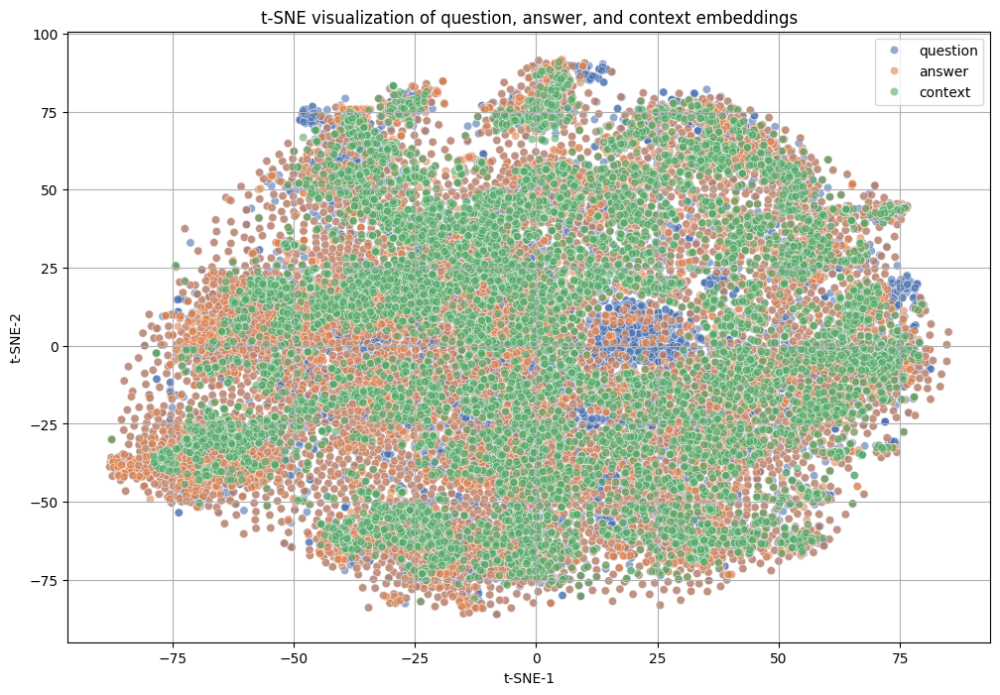

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=labels, palette='deep', alpha=0.6)
plt.title("t-SNE visualization of question, answer, and context embeddings")
plt.xlabel("t-SNE-1")
plt.ylabel("t-SNE-2")
plt.legend()
plt.grid(True)
plt.show()

All three types occupy the same semantic space.There is no hard separation between questions, answers, and contexts.

Contexts (green) dominate and spread densely.This is typical because:
 - Contexts are longer and more information-rich.
 - Their embeddings (average of more tokens) are less noisy, leading to dense clustering.

Questions (blue) are more scattered and sparse.This suggests that answers tend to be semantically close to their contexts.

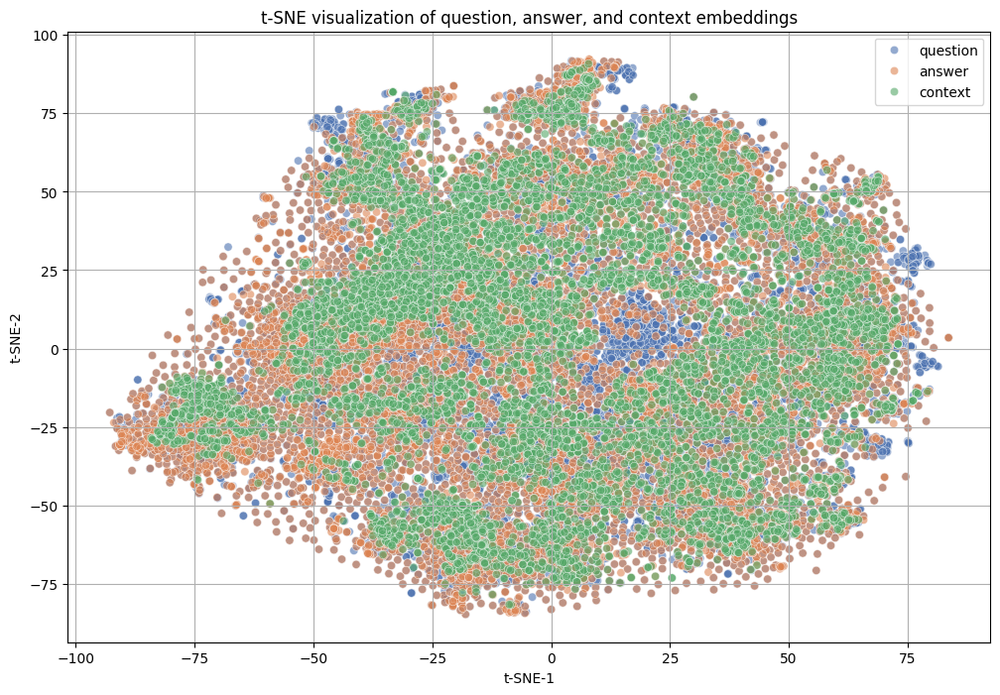

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.scatterplot(x=X_tsne_t[:, 0], y=X_tsne_t[:, 1], hue=labels, palette='deep', alpha=0.6)
plt.title("t-SNE visualization of question, answer, and context embeddings")
plt.xlabel("t-SNE-1")
plt.ylabel("t-SNE-2")
plt.legend()
plt.grid(True)
plt.show()

Same patterns were observed for tagged model as well with minor differences.

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

def cosine_sim(a, b):
    return cosine_similarity([a], [b])[0][0]

In [ ]:
df['q_a_sim'] = df.apply(lambda row: cosine_sim(row['question_vec'], row['answer_vec']), axis=1)
df['q_c_sim'] = df.apply(lambda row: cosine_sim(row['question_vec'], row['context_vec']), axis=1)
df['a_c_sim'] = df.apply(lambda row: cosine_sim(row['answer_vec'], row['context_vec']), axis=1)

In [ ]:
df_t['q_a_sim'] = df_t.apply(lambda row: cosine_sim(row['question_vec'], row['answer_vec']), axis=1)
df_t['q_c_sim'] = df_t.apply(lambda row: cosine_sim(row['question_vec'], row['context_vec']), axis=1)
df_t['a_c_sim'] = df_t.apply(lambda row: cosine_sim(row['answer_vec'], row['context_vec']), axis=1)

## 6. K-Means Clustering on Untagged Data

To group semantically similar text entries, we apply **K-Means clustering** on the sample-level embeddings computed from the original dataset (`df_1 → df`, without POS tagging).

Each sample (context, question, or answer) is represented by the average of its word vectors, as described previously:

$$
\vec{v}_T = \frac{1}{n} \sum_{i=1}^{n} \vec{v}_{w_i}
$$

### K-Means Overview:
K-Means aims to partition \( N \) samples into \( K \) clusters by minimizing the intra-cluster variance:

$$
\underset{C}{\text{argmin}} \sum_{k=1}^{K} \sum_{\vec{x}_i \in C_k} \| \vec{x}_i - \vec{\mu}_k \|^2
$$

Where:
- \( $C_k$ \)  is the set of samples in cluster $k$
- $\vec{\mu}_k$  is the centroid of cluster $k$

We apply K-Means on the untagged sample embeddings and analyze the resulting cluster assignments.


In [ ]:
from sklearn.cluster import KMeans

In [ ]:
X = np.stack(df['question_vec'].values)
kmeans = KMeans(n_clusters=5, random_state=42)
df['question_cluster'] = kmeans.fit_predict(X)

In [ ]:

for i in range(5):
    print(f"\n--- Cluster {i} ---")
    print(df[df['question_cluster'] == i]['question'].head(3).tolist())


--- Cluster 0 ---
[['berry', 'export', 'summary', 'purpose'], ['main', 'difference', 'national', 'sample', 'survey', 'nss', 'india', 'human', 'development', 'survey', 'ihds', 'terms', 'measuring', 'india', 'inequality'], ['cost', 'credit', 'union', 'attendees', 'assets', 'attend', 'conference']]

--- Cluster 1 ---
[['reason', 'closure', 'comments', 'section'], ['love', 'relationship', 'podcasts', 'mentioned', 'context'], ['word', 'quantum', 'mean', 'per', 'context']]

--- Cluster 2 ---
[['unique', 'features', 'coolands', 'twitter', 'app'], ['features', 'fabiana', 'filippi', 'shirts', 'blouses'], ['purpose', 'truglo', 'picatinny', 'riser', 'mount']]

--- Cluster 3 ---
[['gunnar', 'nelson', 'win', 'fight', 'zak', 'cummings', 'ufc', 'fight', 'night'], ['dan', 'foley', 'feel', 'portrayal', 'survivor', 'tv', 'show'], ['lunch', 'kim', 'tony', 'plan', 'monday', 'according', 'context']]

--- Cluster 4 ---
[['benefits', 'reported', 'access', 'self', 'supply', 'water', 'sources'], ['names', 'mo

In [ ]:
X_ans = np.stack(df['answer_vec'].values)
kmeans_ans = KMeans(n_clusters=5, random_state=42)
df['answer_cluster'] = kmeans_ans.fit_predict(X_ans)

In [ ]:
X_ctx = np.stack(df['context_vec'].values)
kmeans_ctx = KMeans(n_clusters=5, random_state=42)
df['context_cluster'] = kmeans_ctx.fit_predict(X_ctx)

In [ ]:
print("Question Clusters:\n", df['question_cluster'].value_counts())
print("\nAnswer Clusters:\n", df['answer_cluster'].value_counts())
print("\nContext Clusters:\n", df['context_cluster'].value_counts())


Question Clusters:
 question_cluster
3    2805
0    2409
2    1747
1    1439
4    1198
Name: count, dtype: int64

Answer Clusters:
 answer_cluster
0    2227
1    2165
2    2163
4    1578
3    1465
Name: count, dtype: int64

Context Clusters:
 context_cluster
0    2790
3    2213
1    1840
4    1760
2     995
Name: count, dtype: int64


### Clustering Summary

We applied **K-Means clustering** independently on the averaged embeddings of the `context`, `question`, and `answer` columns.

Each field was clustered into 5 groups ($k = 5$), and the resulting cluster distributions are:

In the following steps, we will **analyze the contents** of each cluster to interpret what characterizes the groups — such as topic, tone, or structure.


### t-SNE Visualization with K-Means Cluster Labels

To better interpret the clusters formed by K-Means, we apply **t-SNE** to reduce the sample embeddings to 2D space and color the points by their **cluster labels**.

In [ ]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_embedded =tsne.fit_transform(X)

#### Clustering question embedings

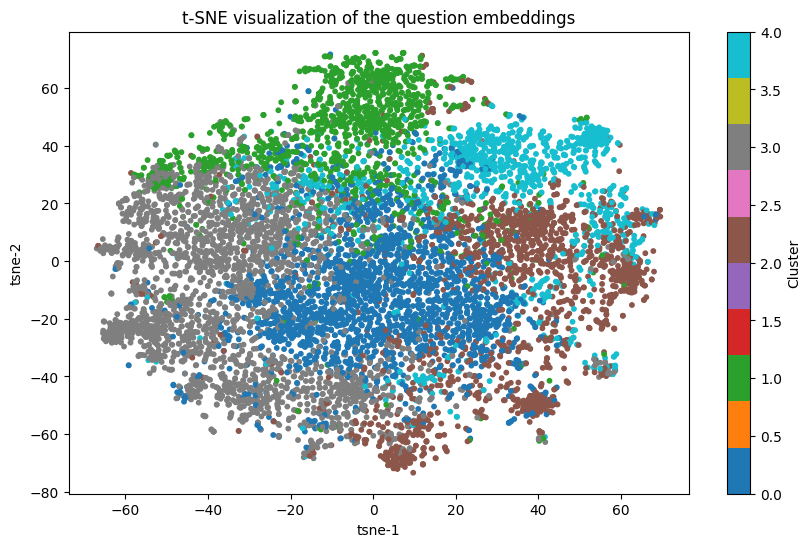

In [ ]:

plt.figure(figsize=(10, 6))
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=df['question_cluster'], cmap='tab10', s=10)
plt.title("t-SNE visualization of the question embeddings")
plt.xlabel("tsne-1")
plt.ylabel("tsne-2")
plt.colorbar(label='Cluster')
plt.show()

In the t-SNE visualization of the **question embeddings**, we observe that **Cluster 2** is noticeably more **sparse** and **dispersed** compared to other clusters.Let's go deeper on this.

In [ ]:
cluster_2_questions = df[df['question_cluster'] == 2]['question']
cluster_2_questions.sample(10, random_state=42).tolist()

[['main', 'function', 'audio', 'waterproof', 'housing', 'ipod', 'shuffle'],
 ['change',
  'user',
  'suggest',
  'improve',
  'usability',
  'component',
  'visibility',
  'sub',
  'menu',
  'vmcs'],
 ['methods', 'automated', 'backup', 'systems', 'computer', 'files'],
 ['fuel', 'economy', 'infiniti', 'litre', 'petrol', 'engine'],
 ['purpose', 'microsoft', 'visual', 'studio', 'net'],
 ['ceo', 'ca', 'inc'],
 ['options',
  'consumers',
  'looking',
  'best',
  'budget',
  'cpus',
  'according',
  'discussion'],
 ['reason', 'speaker', 'buy', 'sets', 'major', 'retailers', 'anymore'],
 ['products', 'author', 'bought', 'november'],
 ['benefits', 'connecting', 'asus', 'padfone', 'docking', 'station']]

| Sample | Question Summary                                    |
| ------ | --------------------------------------------------- |
| 1      | Functional features of waterproof iPod accessories  |
| 2      | UI improvement suggestions for a software component |
| 3      | Methods for automated file backup                   |
| 4      | Fuel economy of a specific car engine               |
| 5      | Purpose of Microsoft Visual Studio                  |
| 6      | Identity of a company's CEO                         |
| 7      | Best budget CPUs for consumers                      |
| 8      | Why speakers aren't sold by big retailers anymore   |
| 9      | Products purchased by a specific author in November |
| 10     | Benefits of using Asus docking station              |


These are all very specific, often technical or product-oriented questions.They span different domains: hardware, software, companies, automotive, personal tech.

In [ ]:
df['question_length'] = df['question'].apply(lambda x: len(x) if isinstance(x, list) else 0)
df[df['question_cluster'] == 2]['question_length'].describe()

count    1747.000000
mean        6.290784
std         2.172709
min         2.000000
25%         5.000000
50%         6.000000
75%         7.000000
max        20.000000
Name: question_length, dtype: float64

In [ ]:
cluster_1_questions = df[df['question_cluster'] == 1]['question']
cluster_1_questions.sample(10, random_state=42).tolist()

[['difference',
  'legalization',
  'interracial',
  'marriage',
  'gay',
  'marriage',
  'according',
  'context'],
 ['process', 'credit', 'relief', 'described', 'context'],
 ['purpose', 'vpn', 'packets', 'context', 'industry'],
 ['steps', 'prepare', 'dish', 'mentioned', 'context'],
 ['method',
  'mentioned',
  'context',
  'used',
  'prove',
  'user',
  'robot',
  'buying',
  'stuff',
  'online'],
 ['main', 'focus', 'cpe', 'course', 'mentioned', 'context'],
 ['method',
  'person',
  'adopt',
  'improve',
  'track',
  'record',
  'following',
  'holy',
  'spirit',
  'tells'],
 ['essential', 'dating', 'tips', 'men', 'mentioned', 'context'],
 ['main', 'focus', 'carrie', 'fisher', 'account', 'book', 'shockaholic'],
 ['word',
  'tzedakah',
  'mean',
  'context',
  'rabbi',
  'ephraim',
  'z',
  'buchwald',
  'teachings']]

Semantic Features of Cluster 1

🔹 1. High frequency of the word “context”
Almost every question includes "context" or "mentioned in context".
This suggests these are context-aware comprehension or reading comprehension style questions.

🔹 2. Templated structure
Many follow the form:

"What is the [$X$] mentioned in the context?"

"What does [$term$] mean in context?"

"What is the main purpose/focus of [$entity$]?"

In [ ]:
cluster_0_questions = df[df['question_cluster'] == 0]['question']
cluster_0_questions.sample(10, random_state=42).tolist()

[['purpose',
  'deployment',
  'missile',
  'system',
  'bastion',
  'southern',
  'kuril',
  'islands',
  'according',
  'russian',
  'foreign',
  'ministry',
  'spokeswoman',
  'maria',
  'zakharova'],
 ['main', 'roles', 'volunteers', 'runday', 'running', 'movement'],
 ['benefits', 'volunteering', 'shugborough'],
 ['total', 'sales', 'national', 'lottery', 'financial', 'year'],
 ['key', 'principles', 'tai', 'chi', 'martial', 'art'],
 ['expected', 'performance', 'asx', 'start', 'week'],
 ['role',
  'senior',
  'devops',
  'engineer',
  'fintech',
  'company',
  'central',
  'london'],
 ['plans', 'enrique', 'peña', 'nieto', 'combat', 'drug', 'gangs', 'mexico'],
 ['primary', 'areas', 'machine', 'learning', 'play', 'important', 'role'],
 ['purpose',
  'american',
  'logistics',
  'aid',
  'network',
  'alan',
  'operate',
  'disaster']]

Features of CLuster 0:

1. Straightforward factual questions
Most queries are asking for definitions, differences, roles, or explanations:

“What is the purpose of ___?”

“What is the cost/role/main difference of ___?”

2. Frequently used "utility" words:
plaintext

"features", "purpose", "services", "offered", "benefits", "types", "used", "main", "system", "user"
These are highly generic nouns or verbs that appear in utility-style informational queries.

In [ ]:
cluster_4_questions = df[df['question_cluster'] == 4]['question']
cluster_4_questions.sample(10, random_state=42).tolist()

[['things', 'need', 'know', 'leave', 'buy', 'car'],
 ['lifestyle',
  'changes',
  'help',
  'slow',
  'process',
  'heart',
  'disease',
  'age'],
 ['author', 'decide', 'use', 'office', 'nursery', 'baby'],
 ['color', 'range', 'labradorite', 'stone', 'described', 'bracelet'],
 ['toys', 'suitable', 'infants', 'aged', 'months'],
 ['picosure', 'laser', 'used', 'skin', 'rejuvenation'],
 ['family',
  'plants',
  'focus',
  'search',
  'natural',
  'products',
  'activity',
  'major',
  'protozoan',
  'pathogens',
  'responsible',
  'human',
  'diseases'],
 ['steps', 'suggested', 'making', 'money', 'long', 'haul', 'stock', 'market'],
 ['process',
  'preparing',
  'meal',
  'using',
  'slow',
  'cooker',
  'according',
  'context'],
 ['common',
  'types',
  'car',
  'bike',
  'collisions',
  'according',
  'david',
  'crowe']]

Cluster 4 represents real-world, practical life queries — focused on health, parenting, finance, cooking, consumer products, and routines.

In [ ]:
cluster_3_questions = df[df['question_cluster'] == 3]['question']
cluster_3_questions.sample(10, random_state=42).tolist()

[['hosted', 'clean', 'slate', 'read', 'thon'],
 ['founder', 'beaver', 'creek', 'soap', 'co'],
 ['scored',
  'game',
  'winning',
  'goal',
  'ice',
  'hockey',
  'match',
  'quinnipiac',
  'university',
  'dartmouth'],
 ['many', 'times', 'grayshott', 'hampshire', 'village', 'year', 'award'],
 ['distinguished',
  'conduct',
  'medal',
  'dcm',
  'replaced',
  'conspicuous',
  'gallantry',
  'cross'],
 ['decided', 'retire', 'florida', 'state', 'coach'],
 ['heather', 'divas', 'run', 'bling'],
 ['win', 'collection', 'pack', 'fancy', 'pants', 'blissful', 'blizzard'],
 ['central', 'figures', 'novel', 'tiger', 'hills'],
 ['rumored', 'direct', 'next', 'installment', 'avengers', 'infinity', 'war']]

Cluster 3 groups factoid-style, news/event/trivia-based questions involving proper nouns and named entities.
These questions likely stem from:
 - Current events

 - Media content

 - Sports

 - Biographies

 - Awards & pop culture

#### Combined Clustering of Context, Question, and Answer

To explore whether semantic patterns are preserved across different fields, we **combined the embeddings of `context`, `question`, and `answer`** for each sample into a single unified representation.


In [ ]:
df_q = pd.DataFrame(df['question_vec'].tolist())
df_q['type'] = 'question'
df_a = pd.DataFrame(df['answer_vec'].tolist())
df_a['type'] = 'answer'
df_c = pd.DataFrame(df['context_vec'].tolist())
df_c['type'] = 'context'
# объединяем
df_all = pd.concat([df_q, df_a, df_c], ignore_index=True)

In [ ]:
X_all = df_all.drop(columns=['type']).values
tsne_all = TSNE(n_components=2, random_state=42, perplexity=50)
X_2d = tsne_all.fit_transform(X_all)

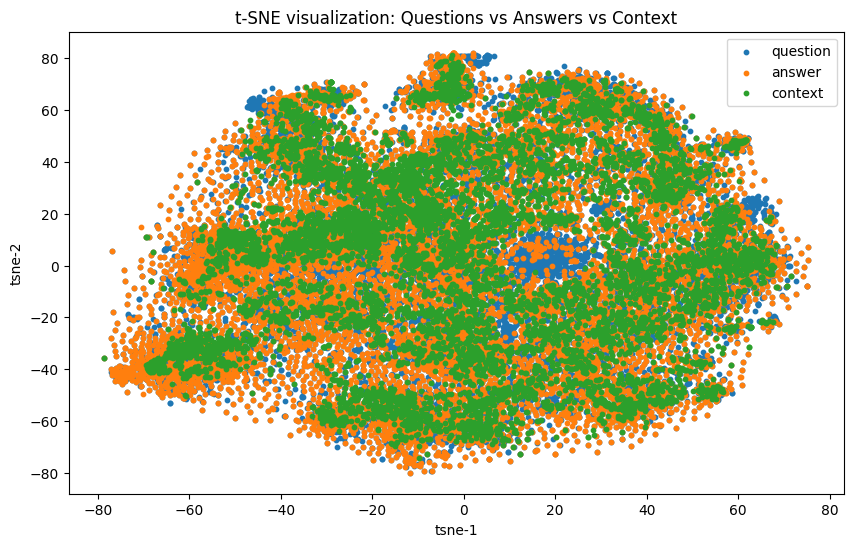

In [ ]:
df_all['tsne-1'] = X_2d[:, 0]
df_all['tsne-2'] = X_2d[:, 1]

plt.figure(figsize=(10, 6))

for label in df_all['type'].unique():
    subset = df_all[df_all['type'] == label]
    plt.scatter(subset['tsne-1'], subset['tsne-2'], label=label, s=10)

plt.legend()
plt.title("t-SNE visualization: Questions vs Answers vs Context")
plt.xlabel("tsne-1")
plt.ylabel("tsne-2")
plt.show()

Answers and contexts often share similar semantic features. This means answers are frequently extracted or closely related to the context in QA datasets.

Questions are more sparse meaning that they are semantically distinct.Their phrasing may vary more (e.g., interrogatives, syntax differences). Potentially higher lexical variance than answer/context

## 7. K-Means Clustering on POS-Tagged Data

We now apply **K-Means clustering** on the embeddings generated from the **POS-tagged** dataset (`df_tagged → df`).  
Unlike the previous setup, here each word includes its part-of-speech label (e.g., `regulation_NN`, `like_VB`), allowing the model to distinguish between different grammatical roles of the same word.

### Objective:
To evaluate whether syntactic information captured via POS tags improves semantic grouping in the clustering step.


In [ ]:
X_t = np.stack(df_t['context_vec'].values)
kmeans_t = KMeans(n_clusters=5, random_state=42)
df_t['context_cluster'] = kmeans_t.fit_predict(X_t)
for i in range(5):
    print(f"\n--- Cluster {i} ---")
    print(df_t[df_t['context_cluster'] == i]['context'].head(3).tolist())


--- Cluster 0 ---
[['gunnar_NN', 'nelson_NN', 'took_VBD', 'time_NN', 'feet_NNS', 'zak_JJ', 'cummings_NNS', 'tonight_VBD', 'co_NN', 'main_JJ', 'event_NN', 'ufc_JJ', 'fight_NN', 'night_NN', 'finally_RB', 'saw_VBD', 'opportunity_NN', 'switch_NN', 'gears_NNS', 'second_JJ', 'round_NN', 'pounced_VBD', 'taking_VBG', 'opponent_JJ', 'mat_NN', 'seizing_VBG', 'back_RP', 'locking_VBG', 'fight_NN', 'ending_VBG', 'choke_VBD', 'almost_RB', 'effortlessly_RB', 'round_JJ', 'nelson_RB', 'usual_JJ', 'karate_NN', 'style_NN', 'stance_NN', 'keeps_VBZ', 'range_JJ', 'cummings_NNS', 'early_JJ', 'strikes_NNS', 'presses_NNS', 'clinch_JJ', 'cummings_NNS', 'matches_NNS', 'jockey_JJ', 'position_NN', 'break_IN', 'apart_JJ', 'nelson_JJ', 'lands_NNS', 'good_JJ', 'knee_NN', 'nelson_NN', 'lands_VBZ', 'right_JJ', 'hook_NN', 'misses_NNS', 'overhand_VBP', 'nelson_JJ', 'relaxed_JJ', 'alert_NN', 'continually_RB', 'makes_VBZ', 'cumming_VBG', 'miss_JJ', 'backing_NN', 'enough_RB', 'right_JJ', 'hand_NN', 'counter_NN', 'lands_VBZ

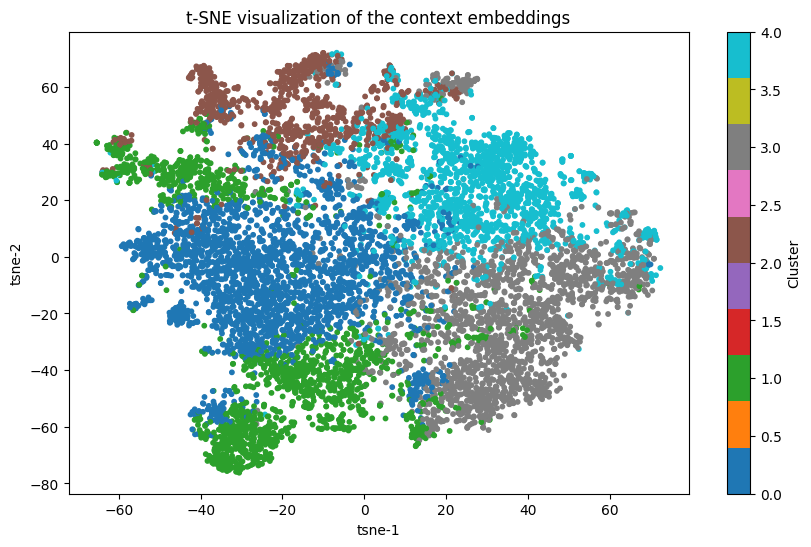

In [ ]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_embedded =tsne.fit_transform(X_t)
plt.figure(figsize=(10, 6))
plt.scatter(X_embedded[:, 0], X_embedded[:, 1], c=df['context_cluster'], cmap='tab10', s=10)
plt.title("t-SNE visualization of the context embeddings")
plt.xlabel("tsne-1")
plt.ylabel("tsne-2")
plt.colorbar(label='Cluster')
plt.show()

### Comparison: Tagged vs Untagged Clustering

Clustering results using **POS-tagged data** are broadly similar to those from the **untagged** data, with only minor differences in cluster structure and distribution.

### Key Observations:
- The overall **number and balance of clusters** remains stable between the two settings.
- POS tagging introduces **slight improvements** in grouping syntactically similar samples, particularly in disambiguating words like "run" (verb vs noun) or "like" (verb vs preposition).
- Some clusters appear **marginally tighter** or **more coherent** in the tagged setup, especially for question and answer texts.

### Conclusion:
While POS tagging does not drastically change clustering outcomes, it adds useful syntactic granularity that may benefit **interpretability** and **downstream analysis**, especially in more linguistically diverse corpora.


## 8. Cosine Similarity Analysis

To quantitatively assess the **semantic alignment** between the fields (`context`, `question`, and `answer`), we compute **cosine similarity** between their vector embeddings.

Cosine similarity measures the **angle** between two vectors in the embedding space, providing a normalized score of their directional alignment.

### Formula:

Given two vectors , the cosine similarity is defined as:

$$
\text{cosine\_sim}(\vec{a}, \vec{b}) = \frac{\vec{a} \cdot \vec{b}}{\|\vec{a}\| \, \|\vec{b}\|}
$$


### Purpose:
- Identify how closely related each pair of text fields is, semantically
- Detect samples with **strong alignment** (e.g., context and answer are tightly connected)
- Spot **inconsistencies or noise**, where cosine similarity is low


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Ensure vectors are numpy arrays
df['q_a_sim'] = df.apply(lambda row: cosine_similarity(
    [row['question_vec']], [row['answer_vec']])[0][0], axis=1)

df['q_c_sim'] = df.apply(lambda row: cosine_similarity(
    [row['question_vec']], [row['context_vec']])[0][0], axis=1)

df['a_c_sim'] = df.apply(lambda row: cosine_similarity(
    [row['answer_vec']], [row['context_vec']])[0][0], axis=1)


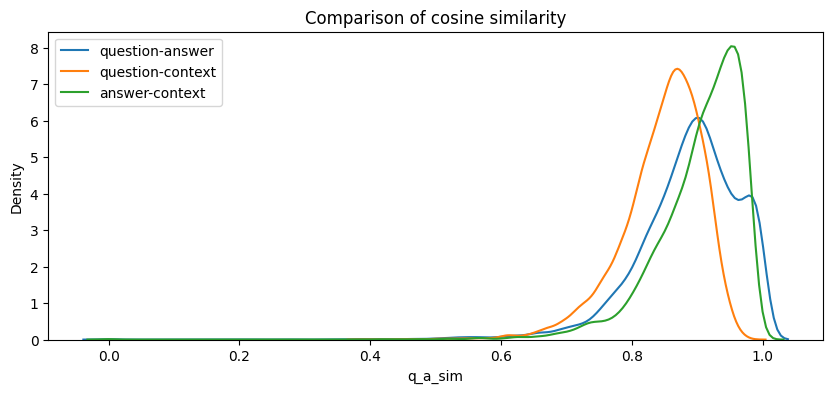

In [ ]:
import seaborn as sns

plt.figure(figsize=(10, 4))
sns.kdeplot(df['q_a_sim'], label='question-answer')
sns.kdeplot(df['q_c_sim'], label='question-context')
sns.kdeplot(df['a_c_sim'], label='answer-context')
plt.legend()
plt.title("Comparison of cosine similarity")
plt.show()

### Cosine Similarity Insights

The distribution of cosine similarity scores revealed meaningful semantic relationships among the text fields:

- **Answers are more similar to the context** than questions are, indicating that answers are typically well-aligned with the source information.
- **Questions show the lowest similarity to answers**, which suggests that answers are **not simply rephrasings**, but instead reflect **deeper reasoning** or **inference** based on the context.

### Interpretation:
These findings support the idea that:
- **Questions abstract away** from the raw context, often focusing on a specific subtopic or fact.
- **Answers are derived** more directly from the context, incorporating key terms and phrasing found in it.

This reinforces the value of context-aware models that can bridge the semantic gap between questions and answers.


# 📕 Semantic analysis of dataset (by [Sentence Transformer](https://sbert.net/docs/quickstart.html#sentence-transformer))

In [ ]:
# required library
!pip install datasets
!pip install -U sentence-transformers
!pip install torch
!pip install scikit-learn matplotlib

In [ ]:
from sentence_transformers import SentenceTransformer
from tqdm import tqdm
import numpy as np
from datasets import load_dataset

In [ ]:
dataset = load_dataset("neural-bridge/rag-dataset-12000", split="train")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/5.18k [00:00<?, ?B/s]

(…)-00000-of-00001-9df3a936e1f63191.parquet:   0%|          | 0.00/23.1M [00:00<?, ?B/s]

(…)-00000-of-00001-af2a9f454ad1b8a3.parquet:   0%|          | 0.00/5.79M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/9600 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/2400 [00:00<?, ? examples/s]

In [ ]:
def clean_text(text, max_chars=1000):
    return text.strip().replace("\n", " ")[:max_chars]

In [ ]:
valid_dataset = [item for item in dataset if item["question"] and item["answer"] and item["context"]]

questions = [clean_text(item["question"]) for item in valid_dataset]
answers   = [clean_text(item["answer"]) for item in valid_dataset]
contexts  = [clean_text(item["context"]) for item in valid_dataset]

In [ ]:
model = SentenceTransformer("all-MiniLM-L6-v2")

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
# Encode all entries with batching + normalization
q_embeddings = model.encode(questions, normalize_embeddings=True, batch_size=64, show_progress_bar=True)
a_embeddings = model.encode(answers, normalize_embeddings=True, batch_size=64, show_progress_bar=True)
c_embeddings = model.encode(contexts, normalize_embeddings=True, batch_size=64, show_progress_bar=True)

Batches:   0%|          | 0/150 [00:00<?, ?it/s]

Batches:   0%|          | 0/150 [00:00<?, ?it/s]

Batches:   0%|          | 0/150 [00:00<?, ?it/s]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/NLP_project/

/content/drive/MyDrive/NLP_project


In [ ]:
ls

embeddings/              GroupMembers.gdoc  notebooks/            videos/
GroupAssignment2025.pdf  models_results/    ProjectsSummary.gdoc


In [ ]:
np.save("embeddings/q_embeddings.npy", q_embeddings)
np.save("embeddings/a_embeddings.npy", a_embeddings)
np.save("embeddings/c_embeddings.npy", c_embeddings)

In [ ]:
q_embeddings = np.load("embeddings/q_embeddings.npy")
a_embeddings = np.load("embeddings/a_embeddings.npy")
c_embeddings = np.load("embeddings/c_embeddings.npy")

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute pairwise cosine similarity
q_a_sim = cosine_similarity(q_embeddings, a_embeddings).diagonal()
q_c_sim = cosine_similarity(q_embeddings, c_embeddings).diagonal()
a_c_sim = cosine_similarity(a_embeddings, c_embeddings).diagonal()

In [ ]:
print("Average Q–A similarity:", q_a_sim.mean())
print("Average Q–C similarity:", q_c_sim.mean())
print("Average A–C similarity:", a_c_sim.mean())


Average Q–A similarity: 0.7446224
Average Q–C similarity: 0.56535065
Average A–C similarity: 0.6109253


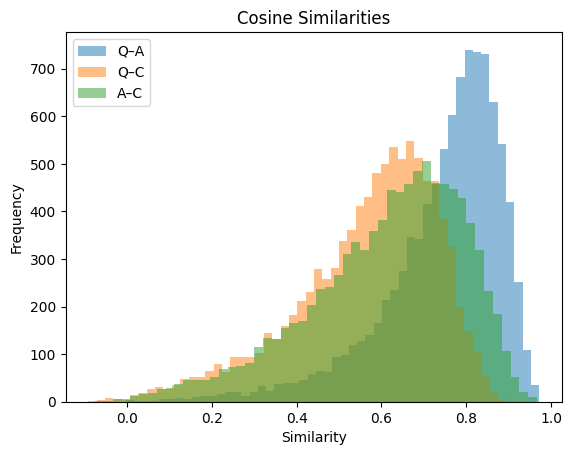

In [ ]:
import matplotlib.pyplot as plt

plt.hist(q_a_sim, bins=50, alpha=0.5, label="Q–A")
plt.hist(q_c_sim, bins=50, alpha=0.5, label="Q–C")
plt.hist(a_c_sim, bins=50, alpha=0.5, label="A–C")
plt.legend()
plt.title("Cosine Similarities")
plt.xlabel("Similarity")
plt.ylabel("Frequency")
plt.show()

In [ ]:
from sklearn.manifold import TSNE

# Run t-SNE on the question embeddings
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
q_tsne = tsne.fit_transform(q_embeddings)


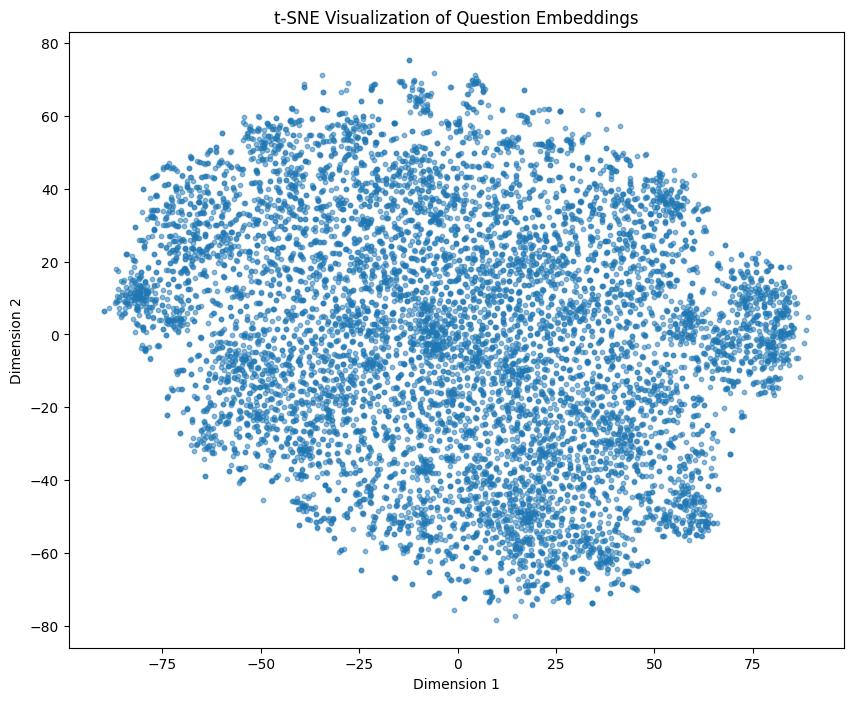

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.scatter(q_tsne[:, 0], q_tsne[:, 1], alpha=0.5, s=10)
plt.title("t-SNE Visualization of Question Embeddings")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.show()


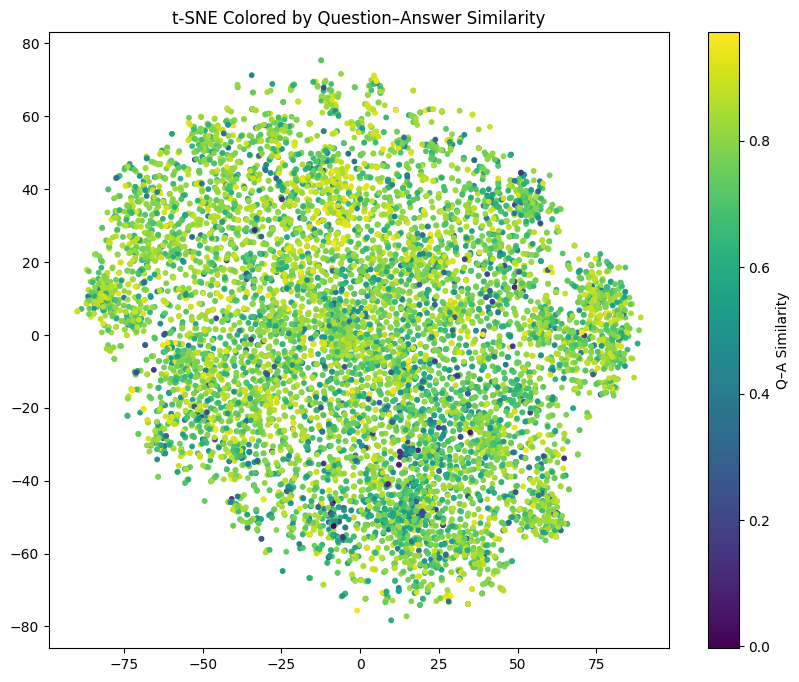

In [ ]:
subset_sim = q_a_sim[:len(q_tsne)]  # match dimensions if subset used

plt.figure(figsize=(10, 8))
plt.scatter(q_tsne[:, 0], q_tsne[:, 1], c=subset_sim, cmap="viridis", s=10)
plt.colorbar(label="Q–A Similarity")
plt.title("t-SNE Colored by Question–Answer Similarity")
plt.show()


In [ ]:
# Optional: use a subset if t-SNE is slow
N = 2000
q_subset = q_embeddings[:N]
a_subset = a_embeddings[:N]
c_subset = c_embeddings[:N]

# Stack all embeddings
all_embeddings = np.vstack([q_subset, a_subset, c_subset])

# Create labels: 0 = question, 1 = answer, 2 = context
labels = np.array([0]*N + [1]*N + [2]*N)

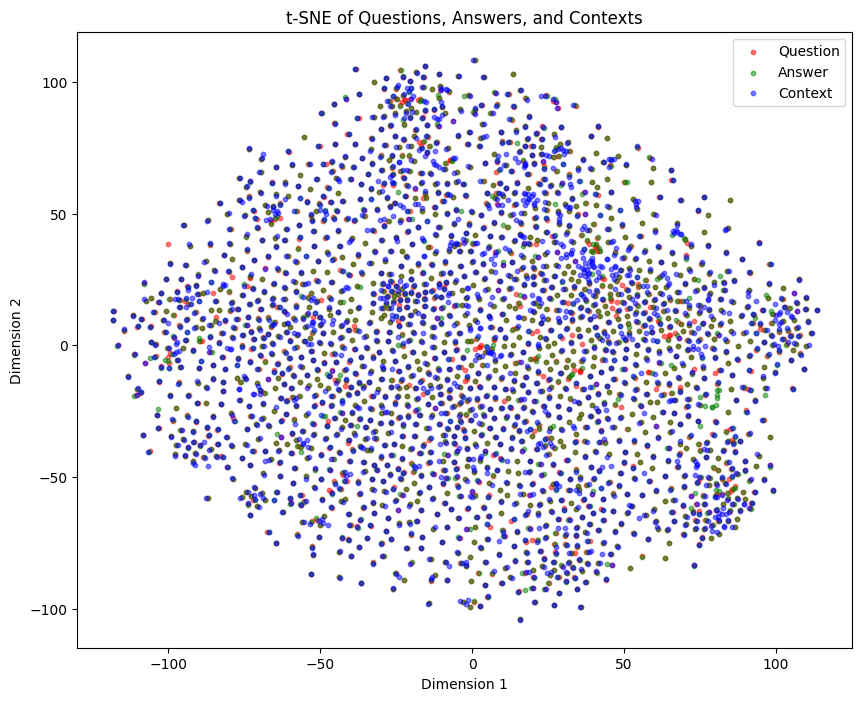

In [ ]:
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=42)
tsne_result = tsne.fit_transform(all_embeddings)

plt.figure(figsize=(10, 8))

# Create color map
colors = ['red', 'green', 'blue']
label_names = ['Question', 'Answer', 'Context']

for label_id in [0, 1, 2]:
    idx = labels == label_id
    plt.scatter(tsne_result[idx, 0], tsne_result[idx, 1],
                s=10, alpha=0.5, label=label_names[label_id], c=colors[label_id])

plt.legend()
plt.title("t-SNE of Questions, Answers, and Contexts")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.show()

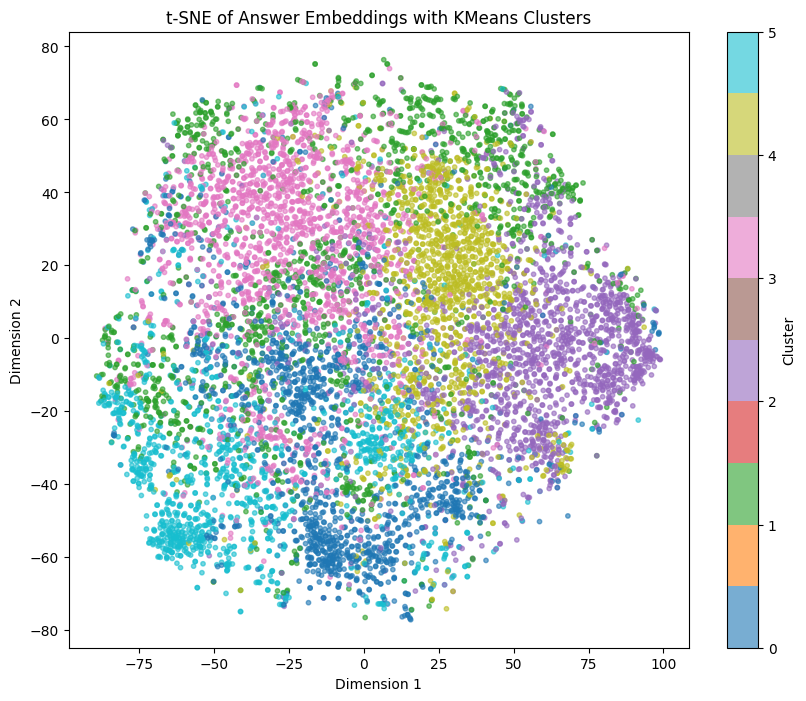

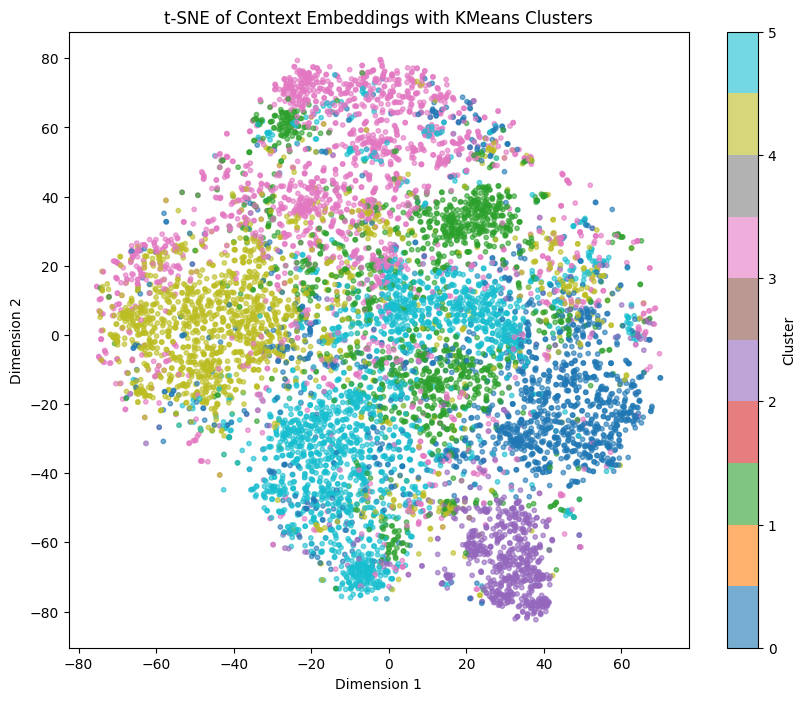

In [ ]:
from sklearn.cluster import KMeans

# Number of clusters to use
num_clusters = 6

# --- Clustering ANSWERS ---
a_labels = KMeans(n_clusters=num_clusters, random_state=42).fit_predict(a_embeddings)
a_tsne = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(a_embeddings)

plt.figure(figsize=(10, 8))
plt.scatter(a_tsne[:, 0], a_tsne[:, 1], c=a_labels, cmap="tab10", s=10, alpha=0.6)
plt.title("t-SNE of Answer Embeddings with KMeans Clusters")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.colorbar(label="Cluster")
plt.show()


# --- Clustering CONTEXTS ---
c_labels = KMeans(n_clusters=num_clusters, random_state=42).fit_predict(c_embeddings)
c_tsne = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(c_embeddings)

plt.figure(figsize=(10, 8))
plt.scatter(c_tsne[:, 0], c_tsne[:, 1], c=c_labels, cmap="tab10", s=10, alpha=0.6)
plt.title("t-SNE of Context Embeddings with KMeans Clusters")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.colorbar(label="Cluster")
plt.show()

## Summary: Semantic Analysis Using Sentence Transformers

We analyzed the semantic structure of the RAG Dataset 12000 using the `sentence-transformers` model (`all-MiniLM-L6-v2`). The goal was to explore how semantically close questions, answers, and their supporting contexts are using dense embeddings.

### Steps Completed:
- Loaded and cleaned all entries in the dataset (questions, answers, contexts).
- Generated semantic embeddings using `sentence-transformers`.
- Calculated cosine similarity scores for:
  - Question–Answer
  - Question–Context
  - Answer–Context
- Applied **t-SNE** to visualize the 2D structure of the embeddings.
- Performed **KMeans clustering** to identify groups of semantically similar items across:
  - Questions
  - Answers
  - Contexts

### Key Observations:
- **Cosine Similarity**: Most question–answer pairs had higher similarity scores than question–context or answer–context, indicating that answers generally reflect the question well.
In contrast, Word2Vec, which relies on word-level overlap, often showed higher similarity between answers and contexts, **due to shared vocabulary rather than deeper semantic meaning**.
- **t-SNE Visualization**:
  - Semantic embeddings of questions, answers, and contexts form distinguishable clusters in 2D space.
  - Contexts tend to be more spread out, which is expected due to their longer and more diverse content.
- **Clustering with KMeans**:
  - For questions, the clusters revealed potential thematic groupings (e.g., health, government, environment).
  - Answers were more compact and easier to cluster, showing semantic uniformity.
  - Contexts were more diverse, but still showed localized structure.



# 📙 Semantic analysis (by LLM embeddings)

In this section, we leverage Vertex AI, a powerful AI platform provided by Google Cloud, to perform semantic analysis using Large Language Model (LLM) embeddings. Vertex AI offers a wide range of machine learning services, including the integration of advanced models like Google’s Gemini. By utilizing the Word Embedding API within Vertex AI, we extract embeddings from our dataset, capturing semantic relationships and meanings of the words in a high-dimensional space.

To analyze these embeddings, we first compute cosine similarity to measure the semantic similarity between the words. This allows us to identify relationships and groupings based on the closeness of their embeddings in the vector space. We then apply t-SNE (t-Distributed Stochastic Neighbor Embedding), a dimensionality reduction technique, to visualize the high-dimensional embeddings in a 2D space. This visualization helps in understanding the underlying patterns and structure in the dataset based on the semantic relationships between the words.




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

path = 'NLP_Project'

os.chdir(f'/content/drive/MyDrive/{path}')
os.getcwd()

'/content/drive/.shortcut-targets-by-id/1CFyMG46IyWxLkOBpkem_zUy2laPX-o4T/NLP_Project'

In [ ]:
!pip install -U datasets

In [ ]:
from datasets import load_dataset

# Load the dataset
dataset = load_dataset(
    "neural-bridge/rag-dataset-12000",
    trust_remote_code=True,
    keep_in_memory=True  # Forces it to stay in RAM and not use Colab's unstable file system
)
train_data = dataset["train"]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/5.18k [00:00<?, ?B/s]

(…)-00000-of-00001-9df3a936e1f63191.parquet:   0%|          | 0.00/23.1M [00:00<?, ?B/s]

(…)-00000-of-00001-af2a9f454ad1b8a3.parquet:   0%|          | 0.00/5.79M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/9600 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/2400 [00:00<?, ? examples/s]

In [ ]:
# Function to handle missing or invalid text entries
def safe_text(text):
    return text if isinstance(text, str) and text.strip() != "" else None

# Prepare the dataset text (question, context, answer)
def prepare_chunks(data):
    query_texts = [ex["question"] for ex in data if safe_text(ex["question"]) is not None]
    context_texts = [ex["context"] for ex in data if safe_text(ex["context"]) is not None]
    answer_texts = [ex["answer"] for ex in data if safe_text(ex["answer"]) is not None]
    return query_texts, context_texts, answer_texts

# Prepare the text chunks
query_chunks, context_chunks, answer_chunks = prepare_chunks(train_data)

## Retrieving word embedding vectors

First some set up for connecting to google cloud and vertex ai is needed.

In [ ]:
!pip install -q google-cloud-aiplatform

In [ ]:
from google.colab import auth
auth.authenticate_user()

In [ ]:
import vertexai
from vertexai.preview.language_models import TextEmbeddingModel

vertexai.init(project="gen-lang-client-0529947401", location="us-central1")

# Create empty lists for storing embeddings
query_embeddings = []
context_embeddings = []
answer_embeddings = []


In [ ]:
# A function responsible of requesting for through embeddings to vertex ai word embedding api
def embed_in_batches_with_metadata(texts, batch_size=250):
    all_embeddings = []
    model = TextEmbeddingModel.from_pretrained("text-embedding-005")

    # Clean out empty or None entries, but preserve the original index
    cleaned_texts = [(idx, text) for idx, text in enumerate(texts) if text and text.strip() != ""]

    # Embed in batches
    for i in range(0, len(cleaned_texts), batch_size):
        batch = [text for _, text in cleaned_texts[i:i + batch_size]]
        embeddings = model.get_embeddings(batch)

        for idx, e in enumerate(embeddings):
            original_index = cleaned_texts[i + idx][0]  # Get the original index of the text
            chunk_info = {
                "embedding": e.values,
                "text": cleaned_texts[i + idx][1],  # Text for this chunk
                "text_id": original_index  # Preserve the original index as chunk_id
            }
            all_embeddings.append(chunk_info)

    return all_embeddings

Here we extract the embedding for different parts of our dataset; questions, context, and answers. We then store the embeddings for later use.

In [ ]:
query_embeddings = embed_in_batches_with_metadata(query_chunks)

In [ ]:
import pickle

# # Save embeddings
# with open("embedding_output/vertex_ai_query_embeddings.pkl", "wb") as f:
#     pickle.dump(query_embeddings, f)

# Later, load them
with open("embedding_output/vertex_ai_query_embeddings.pkl", "rb") as f:
    query_embeddings = pickle.load(f)

In [ ]:
answer_embeddings = embed_in_batches_with_metadata(answer_chunks)

In [ ]:
import pickle

# # Save embeddings
# with open("embedding_output/vertex_ai_answer_embeddings.pkl", "wb") as f:
#     pickle.dump(answer_embeddings, f)

# Later, load them
with open("embedding_output/vertex_ai_answer_embeddings.pkl", "rb") as f:
    answer_embeddings = pickle.load(f)

for retrieving the embeddings of contexts as their long and some of them exceed the 20000 tokens qouta of vertex ai embedding we first create overlapping sub-batches of the texts then extract the embeddings.

In [ ]:
# defining some helpful functions
def count_tokens(text):
    return len(text.split())


def split_text(text, max_tokens=300, overlap=50):
    words = text.split()
    chunks = []
    for i in range(0, len(words), max_tokens - overlap):
        chunk = " ".join(words[i:i + max_tokens])
        chunks.append(chunk)
    return chunks

In [ ]:
def embed_documents_with_ids(documents, max_chunk_tokens=300, overlap=50, max_batch_tokens=19000):
    results = []
    embedding_model = TextEmbeddingModel.from_pretrained("text-embedding-005")

    for doc_id, doc in enumerate(documents):
        chunks = split_text(doc, max_tokens=max_chunk_tokens, overlap=overlap)
        batch = []
        chunk_info = []
        token_count = 0

        for chunk_id, chunk in enumerate(chunks):
            chunk_tokens = count_tokens(chunk)

            if token_count + chunk_tokens > max_batch_tokens:
                # Embed current batch
                embeddings = embedding_model.get_embeddings(batch)
                for info, emb in zip(chunk_info, embeddings):
                    results.append({
                        "embedding": emb.values,
                        "chunk_text": info["text"],
                        "doc_id": info["doc_id"],
                        "chunk_id": info["chunk_id"]
                    })
                # Reset batch
                batch = []
                chunk_info = []
                token_count = 0

            batch.append(chunk)
            chunk_info.append({
                "text": chunk,
                "doc_id": doc_id,
                "chunk_id": chunk_id
            })
            token_count += chunk_tokens

        # Final leftover batch
        if batch:
            embeddings = embedding_model.get_embeddings(batch)
            for info, emb in zip(chunk_info, embeddings):
                results.append({
                    "embedding": emb.values,
                    "chunk_text": info["text"],
                    "doc_id": info["doc_id"],
                    "chunk_id": info["chunk_id"]
                })

    return results

In [ ]:
context_embeddings = embed_documents_with_ids(context_chunks)

In [ ]:
# with open("embedding_output/vertex_ai_context_embeddings.pkl", "wb") as f:
#     pickle.dump(context_embeddings, f)


with open("embedding_output/vertex_ai_context_embeddings.pkl", "rb") as f:
   context_embeddings = pickle.load(f)

In [ ]:
# formats of these embeddings

print(f" type of query_embeddings: {type(query_embeddings)}, \n The list of the keys: {query_embeddings[0].keys()}")
print(f" type of answer_embeddings: {type(answer_embeddings)}, \n The list of the keys: {answer_embeddings[0].keys()}")
print(f" type of context_embeddings: {type(context_embeddings)}, \n The list of the keys: {context_embeddings[0].keys()}")

 type of query_embeddings: <class 'list'>, 
 The list of the keys: dict_keys(['embedding', 'text', 'text_id'])
 type of answer_embeddings: <class 'list'>, 
 The list of the keys: dict_keys(['embedding', 'text', 'text_id'])
 type of context_embeddings: <class 'list'>, 
 The list of the keys: dict_keys(['embedding', 'chunk_text', 'doc_id', 'chunk_id'])


## Cosine Similarity

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Extracting the embedding vectors
query_vectors = [qe['embedding'] for qe in query_embeddings]
answer_vectors = [ae['embedding'] for ae in answer_embeddings]
context_vectors = [ce['embedding'] for ce in context_embeddings]

In [ ]:
# Function to get the top N most similar items (answers or context chunks) along with their texts
def get_top_n_similar_with_text(similarity_matrix, top_n=5, query_index=None, answer_texts=None, context_embeddings=None):
    top_similar_indices = np.argsort(similarity_matrix[query_index])[-top_n:]
    top_similarities = similarity_matrix[query_index][top_similar_indices]

    similar_items = []

    for idx, sim in zip(top_similar_indices, top_similarities):
        if answer_texts is not None:
            similar_info = {
                "similarity": sim,
                "query_text": query_embeddings[query_index]['text'],
                "similar_item_text": answer_texts[idx],
                "similar_item_id": idx
            }
        elif context_embeddings is not None:
            similar_info = {
                "similarity": sim,
                "query_text": query_embeddings[query_index]['text'],
                "similar_item_text": context_embeddings[idx]['chunk_text'],
                "similar_item_id": idx,
                "doc_id": context_embeddings[idx]['doc_id'],
                "chunk_id": context_embeddings[idx]['chunk_id']
            }

        similar_items.append(similar_info)

    return sorted(similar_items, key=lambda x: x['similarity'], reverse=True)

In [ ]:
# Compute the cosine similarity between queries and answers
query_answer_sim = cosine_similarity(query_vectors, answer_vectors)

# Compute the cosine similarity between queries and contexts
query_context_sim = cosine_similarity(query_vectors, context_vectors)

# Compute the cosine similarity between answers and contexts
answer_context_sim = cosine_similarity(answer_vectors, context_vectors)

In [ ]:
query_index = 758

# Get the top 5 most similar answers for the specified query
top_similar_answers = get_top_n_similar_with_text(query_answer_sim, top_n=5, query_index=query_index,
                                                  answer_texts=[ae['text'] for ae in answer_embeddings])

In [ ]:
# Print the query itself
print(f"Query (ID: {query_embeddings[query_index]['text_id']}): '{query_embeddings[query_index]['text']}'\n")

Query (ID: 758): 'What is the retail price and the discounted price of the Delta Faucet 75055 Wall Mount Soap Dispenser?'



In [ ]:
# Print the top 5 most similar answers for the given query
print(f"Top 5 Most Similar Answers for Query (ID: {query_embeddings[query_index]['text_id']}):")
for i, similar_item in enumerate(top_similar_answers):
    print(f"Answer (ID: {similar_item['similar_item_id']}): '{similar_item['similar_item_text']}', Similarity: {similar_item['similarity']:.4f}")
print("\n" + "-"*50)

Top 5 Most Similar Answers for Query (ID: 758):
Answer (ID: 758): 'The retail price of the Delta Faucet 75055 Wall Mount Soap Dispenser is $33.05 and the discounted price is $21.48.', Similarity: 0.9355
Answer (ID: 7448): 'The coupon code "DealNews10" cuts the price by $10.', Similarity: 0.5223
Answer (ID: 4538): 'The discount offered on a Birthday Basket purchase of $150 or more is $20.', Similarity: 0.5178
Answer (ID: 3483): 'The length of the New Yorker Soho Wall Light is 350mm and it projects from the wall by 70mm.', Similarity: 0.5062
Answer (ID: 2818): 'The Alen A350 Air Purifier features electronic controls, HEPA filtration, and a lifetime warranty. It is lightweight and compact, with a user-friendly interface and the ability to be mounted on the wall. The unit is quiet, easy to use and maintain, and energy efficient. It also comes with Alen's standard Lifetime Warranty, ensuring coverage should the product malfunction.', Similarity: 0.5059

-------------------------------------

In [ ]:
# Get the top 5 most similar contexts for the specified query
top_similar_contexts = get_top_n_similar_with_text(query_context_sim, top_n=5, query_index=query_index,
                                                   context_embeddings=context_embeddings)

In [ ]:
print(f"Top 5 Most Similar Contexts for Query (ID: {query_embeddings[query_index]['text_id']}):")
for i, similar_item in enumerate(top_similar_contexts):
    print(f"Context (Doc ID: {similar_item['doc_id']}, Chunk ID: {similar_item['chunk_id']}): "
          f"'{similar_item['similar_item_text']}', Similarity: {similar_item['similarity']:.4f}\n")

Top 5 Most Similar Contexts for Query (ID: 758):
Context (Doc ID: 759, Chunk ID: 0): 'Ends *Exclusions New Lower Pricing, No Coupon Necessary. Hurry. Limited Time Only! No Minimums. Ships the Same Business Day When Order is Placed Before 3:00 p.m.(CST)* View the entire Victorian Collection by Delta Faucet The Delta Faucet T17455 has additional Required/Recommended options. To configure, add to your cart. Delta Faucet 75055Wall Mount Soap DispenserRetail Price: $33.05Your Price: $21.48 Delta Faucet RP33791LHPSingle Handle Deck Mount HandShowerRetail Price: $393.25Your Price: $255.61 Delta Faucet RP37039Soap Lotion DispenserRetail Price: $66.10Your Price: $42.97 Delta Faucet A716Handle Accent KitRetail Price: $12.95Your Price: $9.07 Delta Faucet 75035Double Robe HookRetail Price: $28.20Your Price: $18.33 Delta Faucet 75056Wall Mount Toothbrush/Tumbler HolderRetail Price: $40.55Your Price: $26.36 Delta Faucet 7522424" Double Towel BarRetail Price: $90.45Your Price: $58.79 Delta Faucet 750

In [ ]:
print(context_chunks[759])

Ends *Exclusions
New Lower Pricing, No Coupon Necessary.
Hurry. Limited Time Only! No Minimums.
Ships the Same Business Day When Order is Placed Before 3:00 p.m.(CST)*
View the entire Victorian Collection by Delta Faucet
The Delta Faucet T17455 has additional Required/Recommended options. To configure, add to your cart.
Delta Faucet 75055Wall Mount Soap DispenserRetail Price: $33.05Your Price: $21.48
Delta Faucet RP33791LHPSingle Handle Deck Mount HandShowerRetail Price: $393.25Your Price: $255.61
Delta Faucet RP37039Soap Lotion DispenserRetail Price: $66.10Your Price: $42.97
Delta Faucet A716Handle Accent KitRetail Price: $12.95Your Price: $9.07
Delta Faucet 75035Double Robe HookRetail Price: $28.20Your Price: $18.33
Delta Faucet 75056Wall Mount Toothbrush/Tumbler HolderRetail Price: $40.55Your Price: $26.36
Delta Faucet 7522424" Double Towel BarRetail Price: $90.45Your Price: $58.79
Delta Faucet 75046Towel RingRetail Price: $35.25Your Price: $22.91
Single Handle Monitor 17 Series Tub

In [ ]:
print(query_chunks[758])

What is the retail price and the discounted price of the Delta Faucet 75055 Wall Mount Soap Dispenser?


In [ ]:
print(answer_chunks[758])

The retail price of the Delta Faucet 75055 Wall Mount Soap Dispenser is $33.05 and the discounted price is $21.48.


As you can see the texts are really somehow close semantic wise!

## Clustering

In [ ]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Combine all embeddings (queries, answers, contexts)
all_embeddings = query_vectors + answer_vectors + context_vectors
all_texts = [qe['text'] for qe in query_embeddings] + [ae['text'] for ae in answer_embeddings] + [ce['chunk_text'] for ce in context_embeddings]
labels = (['query'] * len(query_vectors)) + (['answer'] * len(answer_vectors)) + (['context'] * len(context_vectors))

# Applying KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)
cluster_labels = kmeans.fit_predict(all_embeddings)

# Create a DataFrame for easier analysis
df = pd.DataFrame({
    'type': labels,
    'cluster': cluster_labels,
    'embedding': all_embeddings,
    'text': all_texts  # Add the actual text
})

# Inspect the cluster distribution
cluster_distribution = df.groupby(['type', 'cluster']).size().unstack(fill_value=0)
print(cluster_distribution)

cluster     0     1     2     3     4
type                                 
answer   1208  2036  2623  1451  2280
context  3436  6075  4221  7009  6285
query    1148  1661  2798  1359  2632


In [ ]:
# Display some samples from each cluster
for cluster_num in range(5):  # Adjust the number of clusters if necessary
    print(f"Cluster {cluster_num}:")
    cluster_data = df[df['cluster'] == cluster_num]

    # Display a few examples from each cluster (showing text and type)
    print(cluster_data[['type', 'text']].head())  # Adjust the number of samples shown
    print("-" * 50)

Cluster 0:
     type                                               text
13  query  What is the cost for credit union attendees un...
25  query  Who is the designer of this year's Southern Li...
26  query  When was the new village hall opened after a 1...
44  query  Where does Thomas Kosmala source his ingredien...
46  query  What are some of the benefits of becoming a Fr...
--------------------------------------------------
Cluster 1:
     type                                               text
2   query  What are the unique features of the Coolands f...
5   query  What are some of the features of Fabiana Filip...
12  query  What is the purpose of the TRUGLO Picatinny Ri...
16  query  What are some of the names Morganite is also k...
18  query  What are some features of the Womens Drew Argo...
--------------------------------------------------
Cluster 2:
     type                                               text
4   query  How did Gunnar Nelson win the fight against Za...
6   query  

Only queries are shown because we are just showing the head.

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Convert all embeddings into a NumPy array
all_embeddings_np = np.array(all_embeddings)

# Apply t-SNE to reduce embeddings to 2D
tsne = TSNE(n_components=2, perplexity=30, random_state=42, verbose=1)

# Fit the model and reduce the dimensions
reduced_embeddings = tsne.fit_transform(all_embeddings_np)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 46222 samples in 0.024s...
[t-SNE] Computed neighbors for 46222 samples in 125.838s...
[t-SNE] Computed conditional probabilities for sample 1000 / 46222
[t-SNE] Computed conditional probabilities for sample 2000 / 46222
[t-SNE] Computed conditional probabilities for sample 3000 / 46222
[t-SNE] Computed conditional probabilities for sample 4000 / 46222
[t-SNE] Computed conditional probabilities for sample 5000 / 46222
[t-SNE] Computed conditional probabilities for sample 6000 / 46222
[t-SNE] Computed conditional probabilities for sample 7000 / 46222
[t-SNE] Computed conditional probabilities for sample 8000 / 46222
[t-SNE] Computed conditional probabilities for sample 9000 / 46222
[t-SNE] Computed conditional probabilities for sample 10000 / 46222
[t-SNE] Computed conditional probabilities for sample 11000 / 46222
[t-SNE] Computed conditional probabilities for sample 12000 / 46222
[t-SNE] Computed conditional probabilities for s

<ipython-input-27-023e36233816>:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('viridis', len(unique_clusters))  # Use 'tab10' colormap for up to 10 unique clusters


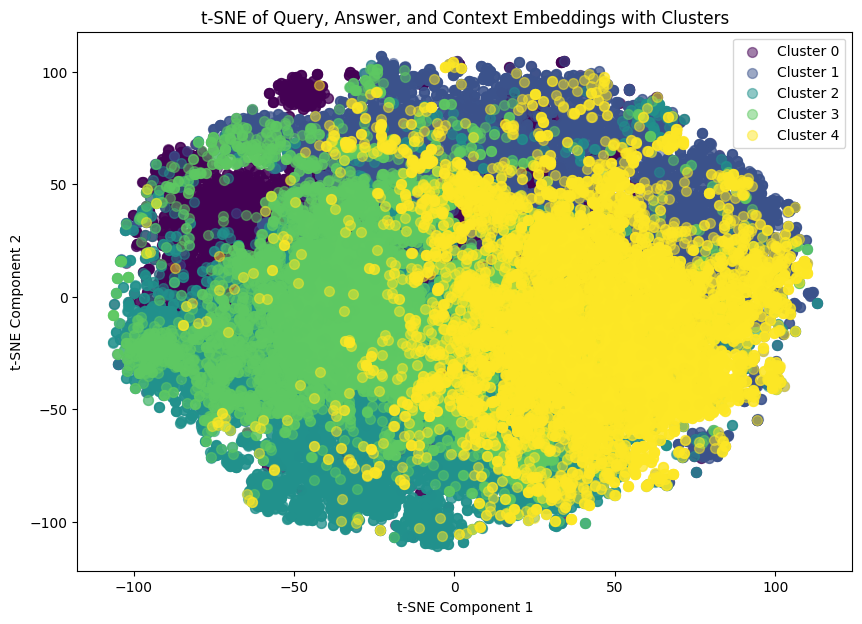

In [ ]:
# Create a color map based on the cluster labels
unique_clusters = np.unique(cluster_labels)  # Assuming cluster_labels is already defined from KMeans
colors = plt.cm.get_cmap('viridis', len(unique_clusters))  # Use 'tab10' colormap for up to 10 unique clusters

# Plot the embeddings with different colors for each cluster
plt.figure(figsize=(10, 7))

for cluster_num in unique_clusters:
    # Get the points corresponding to the current cluster
    cluster_points = reduced_embeddings[cluster_labels == cluster_num]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1], alpha=0.5, label=f"Cluster {cluster_num}",
                c=[colors(cluster_num)], s=50)  # Color points according to the cluster number

# Add labels and title
plt.title("t-SNE of Query, Answer, and Context Embeddings with Clusters")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")

# Show the legend
plt.legend()
plt.show()

In [ ]:
# 3D visualization

# Convert all embeddings into a NumPy array
all_embeddings_np = np.array(all_embeddings)

# Apply t-SNE to reduce embeddings to 3D (3 components)
tsne = TSNE(n_components=3, perplexity=30, random_state=42)

# Fit the model and reduce the dimensions
reduced_embeddings_3d = tsne.fit_transform(all_embeddings_np)

In [ ]:
!pip install plotly

In [ ]:
import plotly.express as px

# Create a DataFrame for easier analysis
df_tsne_3d = pd.DataFrame(reduced_embeddings_3d, columns=['x', 'y', 'z'])
df_tsne_3d['type'] = labels  # Query, Answer, Context
df_tsne_3d['cluster'] = cluster_labels  # The clusters from KMeans

# Plot in 3D with Plotly (interactive)
fig = px.scatter_3d(df_tsne_3d, x='x', y='y', z='z', color='cluster',
                    title="3D t-SNE of Query, Answer, and Context Embeddings with Clusters",
                    labels={'cluster': 'Cluster', 'type': 'Type'},
                    hover_data={'x': False, 'y': False, 'z': False, 'cluster': True, 'type': True})

# Customize the appearance (optional)
fig.update_traces(marker=dict(size=5, opacity=0.7, line=dict(width=1, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

# Show the interactive plot
fig.show()

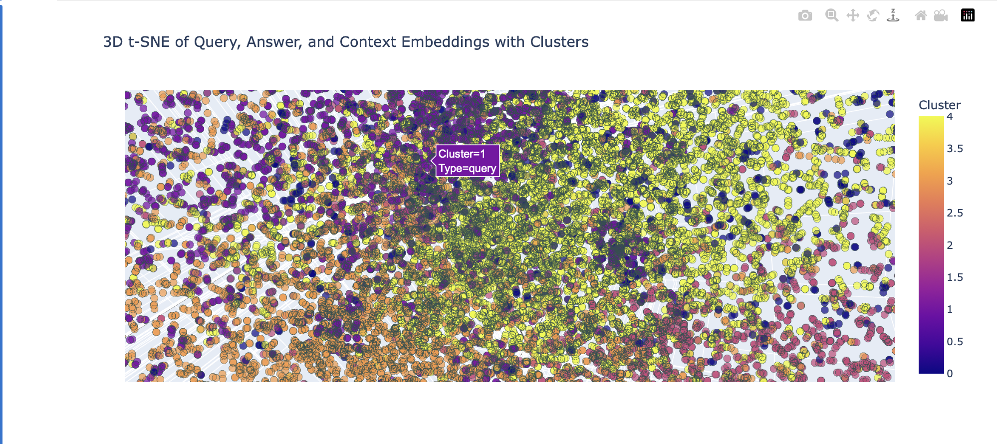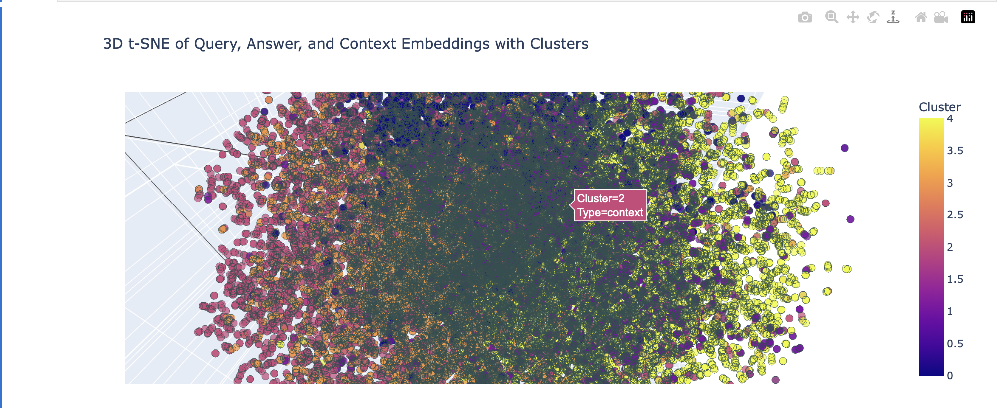

# 🤖 Classical NLP approach

Objective:

To evaluate how effectively basic retrieval techniques (TF-IDF and BM25) can retrieve relevant contexts from a QA dataset, using a heuristic proxy metric: whether the **answer string appears in the retrieved context**.

## TF-IDF Based Retrieval
Used TfidfVectorizer (with stop words removal) to:
* Fit on context
* Transform question into vector space
* Retrieved the most similar context using cosine similarity.

**Evaluation (Exact Match):**

* **Top-1 Accuracy**: 4.68%
(Answer appears in the most similar context)
* **Top-3 Accuracy**: 5.35%
(Answer appears in any of the top 3 most similar contexts)

**Fuzzy Matching (using difflib):**

* Checks for approximate string similarity between answer and context words.
* Accuracy: 0.0067%

In [ ]:
!pip install rank_bm25

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import numpy as np

In [ ]:
splits = {'train': 'data/train-00000-of-00001-9df3a936e1f63191.parquet',
          'test': 'data/test-00000-of-00001-af2a9f454ad1b8a3.parquet'}

df = pd.read_parquet("hf://datasets/neural-bridge/rag-dataset-12000/" + splits["train"])

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
df.head()

,context,question,answer
0,Caption: Tasmanian berry grower Nic Hansen sho...,What is the Berry Export Summary 2028 and what...,The Berry Export Summary 2028 is a dedicated e...
1,RWSN Collaborations\nSouthern Africa Self-supp...,What are some of the benefits reported from ha...,Benefits reported from having access to Self-s...
2,All Android applications categories\nDescripti...,What are the unique features of the Coolands f...,The unique features of the Coolands for Twitte...
3,"How unequal is India? The question is simple, ...",What is the main difference between the Nation...,The main difference between the NSS and the IH...
4,Gunnar Nelson took his time on the feet agains...,How did Gunnar Nelson win the fight against Za...,Gunnar Nelson won the fight against Zak Cummin...


In [ ]:
vectorizer = TfidfVectorizer(stop_words="english")

In [ ]:
df_small = df.sample(300, random_state=42).reset_index(drop=True)

# Drop rows where question or context is missing
df_small = df_small.dropna(subset=["question", "context", "answer"]).reset_index(drop=True)

# Fit on context
context_tfidf = vectorizer.fit_transform(df_small["context"])

# Transform questions
question_tfidf = vectorizer.transform(df_small["question"])

In [ ]:
# Fit on context
context_tfidf = vectorizer.fit_transform(df_small["context"])

# Transform questions
question_tfidf = vectorizer.transform(df_small["question"])

In [ ]:
similarity_matrix = cosine_similarity(question_tfidf, context_tfidf)

In [ ]:
top_indices = similarity_matrix.argmax(axis=1)
retrieved_contexts = df_small["context"].iloc[top_indices].values

In [ ]:
found_answer = [
    df_small["answer"].iloc[i].lower() in retrieved_contexts[i].lower()
    for i in range(len(df_small))
]

In [ ]:
results = pd.DataFrame({
    "question": df_small["question"],
    "true_answer": df_small["answer"],
    "retrieved_context": retrieved_contexts,
    "answer_found": found_answer
})

accuracy = sum(found_answer) / len(found_answer)
print(f"TF-IDF QA Accuracy (answer in retrieved context): {accuracy:.2%}")

TF-IDF QA Accuracy (answer in retrieved context): 4.68%


In [ ]:
top_k = 3
top_k_indices = similarity_matrix.argsort(axis=1)[:, -top_k:]

found_in_top_k = []
for i, row in enumerate(top_k_indices):
    contexts = df_small["context"].iloc[row].str.lower().tolist()
    answer = df_small["answer"].iloc[i].lower()
    found = any(answer in context for context in contexts)
    found_in_top_k.append(found)

top_k_accuracy = sum(found_in_top_k) / len(found_in_top_k)
print(f"Top-{top_k} Accuracy: {top_k_accuracy:.2%}")

Top-3 Accuracy: 5.35%


In [ ]:
false_positives = results[~results["answer_found"]]
false_positives.head(5)

,question,true_answer,retrieved_context,answer_found
0,What is the reaction of the user upon discover...,The user is very happy to discover the site.,"And so, it’s finally happening. Far too late f...",False
1,What is the purpose of split testing in market...,The purpose of split testing in marketing camp...,Subscription growth hack (by PayKickstart)\nFa...,False
2,What measures are being taken by major Asian e...,"Major Asian economies like India, China, South...",Asia's major oil consuming nations have decide...,False
3,"What is the central setting of the movie ""BREA...",The central setting is a military court room w...,>>:Kenneth G. Ross (play)\nJonathan Hardy (scr...,False
4,What was the main issue in the 2006 lawsuit fi...,The main issue in the 2006 lawsuit was that th...,9th Circuit judge urges settlement in campus-s...,False


## BM25 Based Retrieval
* Tokenized context documents and questions.
* Used rank_bm25.BM25Okapi to compute relevance scores.
* Retrieved the top-1 scoring context for each question.

**Evaluation (Exact Match):**

* BM25 Top-1 Accuracy: 5.02%

In [ ]:
from rank_bm25 import BM25Okapi

tokenized_corpus = [context.split() for context in df_small["context"]]
bm25 = BM25Okapi(tokenized_corpus)

scores = [bm25.get_scores(q.split()) for q in df_small["question"]]
top_bm25 = [np.argmax(s) for s in scores]
retrieved = df_small["context"].iloc[top_bm25].values

found_bm25 = [df_small["answer"].iloc[i].lower() in retrieved[i].lower() for i in range(len(df_small))]
print(f"BM25 Top-1 Accuracy: {sum(found_bm25)/len(found_bm25):.2%}")


BM25 Top-1 Accuracy: 5.02%


In [ ]:
from rank_bm25 import BM25Okapi

# Tokenize the contexts
tokenized_corpus = [doc.split() for doc in df_small["context"]]
bm25 = BM25Okapi(tokenized_corpus)

# Score questions
scores = [bm25.get_scores(q.split()) for q in df_small["question"]]
top_indices_bm25 = [np.argmax(s) for s in scores]

# Check answer presence
retrieved_contexts_bm25 = df_small["context"].iloc[top_indices_bm25].values
found_bm25 = [
    df_small["answer"].iloc[i].lower() in retrieved_contexts_bm25[i].lower()
    for i in range(len(df_small))
]

# Accuracy
accuracy_bm25 = sum(found_bm25) / len(found_bm25)
print(f"BM25 Top-1 Accuracy: {accuracy_bm25:.2%}")


BM25 Top-1 Accuracy: 5.02%


In [ ]:
import difflib

def is_answer_fuzzy_match(answer, context, threshold=0.8):
    answer = answer.lower()
    context_words = context.lower().split()
    return any(difflib.SequenceMatcher(None, answer, word).ratio() > threshold for word in context_words)

found_fuzzy = [
    is_answer_fuzzy_match(df_small["answer"].iloc[i], retrieved_contexts[i])
    for i in range(len(df_small))
]
print(f"TF-IDF Accuracy (fuzzy match): {sum(found_fuzzy) / len(found_fuzzy):.2%}")

TF-IDF Accuracy (fuzzy match): 0.67%


In [ ]:
comparison = pd.DataFrame({
    "TF-IDF Top-1": found_answer,
    "TF-IDF Top-3": found_in_top_k,
    "BM25 Top-1": found_bm25,
    "TF-IDF Fuzzy": found_fuzzy
})
print("Method Comparison:")
print(comparison.mean())

Method Comparison:
TF-IDF Top-1    0.046823
TF-IDF Top-3    0.053512
BM25 Top-1      0.050167
TF-IDF Fuzzy    0.006689
dtype: float64


## Conclusions
* **Retrieval Quality** is Low: All methods achieved ~5% accuracy when checking if the true answer was contained in the most similar retrieved context.

* **Top-k** Helps Slightly: Moving from top-1 to top-3 improved performance marginally.

* **Fuzzy Matching** Didn't Help: Exact substring matching remains a limiting factor, and fuzzy matching detected even less.

* **Implication**: Both TF-IDF and BM25, while efficient, are **inadequate** for high-quality open-domain QA on this dataset if we expect the answer to be directly found in the retrieved context.

# 📐 RAG Metrics

In [ ]:
!pip install rouge_score
!pip install rapidfuzz
!pip install sacrebleu
!pip install ragas
!pip install -U sentence-transformers

In [ ]:
# for Google AI Studio
!pip install langchain-google-genai
# for Google Cloud Vertex AI
!pip install langchain-google-vertexai

## [RAG (Retrieval-Augmented Generation) metrics (LLM based)](https://medium.com/@med.el.harchaoui/rag-evaluation-metrics-explained-a-complete-guide-dbd7a3b571a8)

![RAG_scheme](https://miro.medium.com/v2/resize:fit:1400/format:webp/0*hA2RpiXjL3dvm--v.png)

### For now we will more concentrate on evaluation of Generation part



## Faithfulness

This metric measure how the LLM answer is faithful to the provided context, does it respect what was given as input or not. Its considered as faithful if the claims made in the answer can be extracted from the provided context. To calculate it, we start by extracting all claims from the LLM provided answer first. Then for each claim we check if this one claim can be inferred from the retrieved context. It value range from 0 to 1. Higher is better.

![Faithulness](https://miro.medium.com/v2/resize:fit:1400/format:webp/0*g8cCq5m5Fz2XOPBy.png)

## Answer Relevance

This metric measure the quality of the generated answer given the user query, how pertinent is the answer with respect the the user question. To assess this we need to know if the answer is complete or not, does it contain redundant information ?

To calculate this metric, we generate N question based on the answer, does questions should be normally similar the the original question if the provided answer is relevant to the original question, if not they will be different. To compare the N generated question, we use cosine or dot product vector similarity operators. The value should range between 0 and 1.
The formula for determining answer relevance is as follows:

![Answer Relevance](https://miro.medium.com/v2/resize:fit:1400/format:webp/0*QffodGkNYSRzcH52.png)

## Traditional NLP metrics

### String simillarity

Metric measures the similarity between the reference and the response using traditional string distance measures such as Levenshtein, Hamming, and [Jaro](https://srinivas-kulkarni.medium.com/jaro-winkler-vs-levenshtein-distance-2eab21832fd6)

### [BLEU](https://medium.com/nlplanet/two-minutes-nlp-learn-the-bleu-metric-by-examples-df015ca73a86) (Bilingual Evaluation Understudy)

### [ROUGE](https://medium.com/nlplanet/two-minutes-nlp-learn-the-rouge-metric-by-examples-f179cc285499) (Recall-Oriented Understudy for Gisting Evaluation)



In [ ]:
from sentence_transformers import SentenceTransformer, util
import torch

# Load a small embedding model (you can use a larger one if you have GPU)
model_similarity = SentenceTransformer("all-MiniLM-L6-v2")  # Fast and effective

# Function to compute cosine similarity
def cosine_sim(row):
    answer = row["reference"]
    response = row["response"]
    if pd.isna(answer) or pd.isna(response):
        return None
    emb_answer = model_similarity.encode(answer, convert_to_tensor=True)
    emb_response = model_similarity.encode(response, convert_to_tensor=True)
    return util.cos_sim(emb_answer, emb_response).item()

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
import pandas as pd
import json

from ragas import SingleTurnSample, EvaluationDataset, evaluate

#Traditional metrics
from ragas.metrics._string import NonLLMStringSimilarity, DistanceMeasure
from ragas.metrics import (
    answer_relevancy,
    faithfulness,
    context_recall,
    context_precision,

)
from ragas.metrics import BleuScore, RougeScore

# LLM metrics
from ragas.llms import LangchainLLMWrapper
from ragas.embeddings import LangchainEmbeddingsWrapper
from ragas.metrics import Faithfulness, FaithfulnesswithHHEM, ResponseRelevancy

# Choose the appropriate import based on your API:
from langchain_community.chat_models import ChatOllama
from ragas import evaluate
from langchain_community.embeddings import OllamaEmbeddings

In [ ]:
def convert_dataset_to_list_format(dataset_dict):
    dataset_list_ = []

    # Process train split
    for sample in dataset_dict:
        if sample['answer'] is not None:
            dataset_list_.append({
                "user_input": sample['question'],
                "response": sample['response'],
                "reference": sample['answer'],  # Using answer as reference for now
                "retrieved_contexts": [sample['context']],
                "reference_contexts": [sample['context']]
            })

    return dataset_list_

# 🧾 Prompt Engineering with Gemini 2.0 Flash

Prompt engineering is the practice of crafting clear and effective instructions to guide AI models in generating accurate and relevant outputs. Instead of modifying the model itself, we steer its behavior through carefully designed prompts.

LLMs like Gemini 2.0 Flash are trained on vast amounts of data from across the internet, covering general knowledge and a wide range of topics. While this makes them incredibly powerful, it also means they may produce broad or unfocused answers if not guided properly. Prompt engineering helps narrow the model’s focus to our specific task, improving relevance, accuracy, and efficiency.

In this part of the notebook, we explore three common prompting strategies:

🟢 Zero-Shot: Directly ask the model to perform a task without providing examples.

🟡 One-Shot: Provide one example to illustrate the expected output before asking the model to respond.

🟠 Few-Shot: Provide a few examples to guide the model toward the desired behavior more effectively.


## Environment Setup and Data Preparation

In this section, we perform all the necessary setup before diving into the core part of the project. This includes connecting to Google Drive, configuring access to Vertex AI, downloading the dataset, and preparing its elements for use in the following stages.

To use Vertex AI, we first create a project in Google Cloud and obtain the appropriate credentials. These credentials are then integrated into our code. Additionally, we connect the Google Colab environment to Google Cloud, enabling access to Gemini, Vertex AI models, and related APIs.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd /content/drive/MyDrive/NLP_project/

/content/drive/MyDrive/NLP_project


In [ ]:
!ls

embeddings		 GroupMembers.gdoc  notebooks		  videos
GroupAssignment2025.pdf  models_results     ProjectsSummary.gdoc


In [ ]:
import os
os.getcwd()

'/content/drive/MyDrive/NLP_project'

In [ ]:
# import os

# path = 'NLP_Project'

# os.chdir(f'/content/drive/MyDrive/{path}')
# os.getcwd()

In [ ]:
!pip install -q google-cloud-aiplatform

In [ ]:
from google.colab import auth
auth.authenticate_user()

In [ ]:
!pip install --upgrade --quiet google-genai langchain-google-vertexai langchain

In [ ]:
!pip install -U datasets

In [ ]:
from datasets import load_dataset

dataset = load_dataset("neural-bridge/rag-dataset-12000", split='test')
dataset = dataset.select(range(100))

In [ ]:
import json
import random

dataset = [dict(example) for example in dataset]

In [ ]:
def zero_shot_prompt(context, question):
    return f"""You are a helpful assistant. Use the context below to answer the question.

Context:
{context}

Question:
{question}

Answer:"""



def one_shot_prompt(ex_context, ex_question, ex_answer, context, question):
    return f"""You are a helpful assistant. Answer the question based on the context.

Example:
Context:
{ex_context}
Question:
{ex_question}
Answer:
{ex_answer}

Now try:
Context:
{context}
Question:
{question}
Answer:"""



def few_shot_prompt(examples, context, question):
    examples_text = "\n\n".join([
        f"Example {i+1}:\nContext:\n{ex['context']}\nQuestion:\n{ex['question']}\nAnswer:\n{ex['answer']}"
        for i, ex in enumerate(examples)
    ])

    return f"""You are a helpful assistant. Below are some examples of how to answer questions using context.

{examples_text}

Now, answer this question:
Context:
{context}
Question:
{question}
Answer:"""


In [ ]:
# Querying the model
from google.genai.types import GenerateContentConfig


def get_gemini_answer(prompt):
    config = GenerateContentConfig(temperature=0.2, max_output_tokens=512)
    ''' temperature indicates how accurate or creative should the model be in answering,
    so we set it to 0.2 which tells the model to be accurate with its answers instead of being creative.
    max_output_tokens is also decided on based on the average and max number of tokens in the dataset for answers.
    '''
    response = genai_client.models.generate_content(
        model="gemini-2.0-flash",
        contents=prompt,
        config=config
    )
    return response.text.strip()

## Quering the model with the prompts

In [ ]:
from google import genai

genai_client = genai.Client(vertexai=True, project='nlp-project-459717', location='us-central1')

### Zero-shot

In [ ]:
# Zero Shots
zero_shot_results = []

for ex in dataset:
    # Create a zero-shot prompt using just context and question
    prompt = zero_shot_prompt(
        context=ex["context"],
        question=ex["question"]
    )

    # Send to Gemini
    prediction = get_gemini_answer(prompt)

    # Store result
    zero_shot_results.append({
        "question": ex["question"],
        "reference": ex["answer"],
        "response": prediction
    })


In [ ]:
print(json.dumps(zero_shot_results[:5], indent=2))

[
  {
    "question": "Who is the music director of the Quebec Symphony Orchestra?",
    "reference": "The music director of the Quebec Symphony Orchestra is Fabien Gabel.",
    "response": "Fabien Gabel is the music director of the Quebec Symphony Orchestra."
  },
  {
    "question": "Who were the four students of the University of Port Harcourt that were allegedly murdered?",
    "reference": "The four students of the University of Port Harcourt that were allegedly murdered were Chiadika Lordson, Ugonna Kelechi Obusor, Mike Lloyd Toku and Tekena Elkanah.",
    "response": "The four students of the University of Port Harcourt that were allegedly murdered were Chiadika Lordson, Ugonna Kelechi Obusor, Mike Lloyd Toku and Tekena Elkanah."
  },
  {
    "question": "What did Paul Wall offer to all U.S. Olympic Medalists?",
    "reference": "Paul Wall wants to give free gold grills to all U.S. Olympic Medalists.",
    "response": "Paul Wall wanted to give free gold grills to all U.S. Olympi

In [ ]:
# Save output
with open(f"models_results/Gemini_2_flash_zero_shot.jsonl", 'w', encoding='utf-8') as f:
    for result in zero_shot_results:
        json.dump(result, f, ensure_ascii=False)
        f.write('\n')

### One-shot

In [ ]:
# One shot
one_shot_results = []

one_shot_example = random.choice(dataset)

for ex in dataset:
    if ex == one_shot_example:
        continue

    # Create the one-shot prompt
    prompt = one_shot_prompt(
        ex_context=one_shot_example["context"],
        ex_question=one_shot_example["question"],
        ex_answer=one_shot_example["answer"],
        context=ex["context"],
        question=ex["question"]
    )

    # Send to Gemini
    prediction = get_gemini_answer(prompt)

    # Store results for later evaluation
    one_shot_results.append({
        "question": ex["question"],
        "reference": ex["answer"],
        "response": prediction
    })

In [ ]:
print(json.dumps(one_shot_results[:5], indent=2))

[
  {
    "question": "Who is the music director of the Quebec Symphony Orchestra?",
    "reference": "The music director of the Quebec Symphony Orchestra is Fabien Gabel.",
    "response": "Fabien Gabel is the music director of the Quebec Symphony Orchestra."
  },
  {
    "question": "Who were the four students of the University of Port Harcourt that were allegedly murdered?",
    "reference": "The four students of the University of Port Harcourt that were allegedly murdered were Chiadika Lordson, Ugonna Kelechi Obusor, Mike Lloyd Toku and Tekena Elkanah.",
    "response": "The four students of the University of Port Harcourt that were allegedly murdered were Chiadika Lordson, Ugonna Kelechi Obusor, Mike Lloyd Toku and Tekena Elkanah."
  },
  {
    "question": "What did Paul Wall offer to all U.S. Olympic Medalists?",
    "reference": "Paul Wall wants to give free gold grills to all U.S. Olympic Medalists.",
    "response": "Paul Wall offered to give free gold grills to all U.S. Olymp

In [ ]:
# Save output
with open(f"models_results/Gemini_2_flash_one_shot.jsonl", 'w', encoding='utf-8') as f:
    for result in one_shot_results:
        json.dump(result, f, ensure_ascii=False)
        f.write('\n')

### Few-shot

In [ ]:
# Few-shot

# Pick k few-shot examples
few_shot_k = 3
few_shot_examples = random.sample(dataset, few_shot_k)

In [ ]:
# Store results
few_shot_results = []

for ex in dataset:
    if ex in few_shot_examples:
        continue  # Skip examples already used in the prompt

    # Create prompt using few-shot examples
    prompt = few_shot_prompt(
        examples=few_shot_examples,
        context=ex["context"],
        question=ex["question"]
    )

    # Send to Gemini
    prediction = get_gemini_answer(prompt)

    # Store result
    few_shot_results.append({
        "question": ex["question"],
        "reference": ex["answer"],
        "response": prediction
    })

In [ ]:
# View random 5 results
print(json.dumps(few_shot_results[:5], indent=2))

[
  {
    "question": "Who is the music director of the Quebec Symphony Orchestra?",
    "reference": "The music director of the Quebec Symphony Orchestra is Fabien Gabel.",
    "response": "The music director of the Quebec Symphony Orchestra is Fabien Gabel."
  },
  {
    "question": "Who were the four students of the University of Port Harcourt that were allegedly murdered?",
    "reference": "The four students of the University of Port Harcourt that were allegedly murdered were Chiadika Lordson, Ugonna Kelechi Obusor, Mike Lloyd Toku and Tekena Elkanah.",
    "response": "The four students of the University of Port Harcourt that were allegedly murdered were Chiadika Lordson, Ugonna Kelechi Obusor, Mike Lloyd Toku and Tekena Elkanah."
  },
  {
    "question": "What did Paul Wall offer to all U.S. Olympic Medalists?",
    "reference": "Paul Wall wants to give free gold grills to all U.S. Olympic Medalists.",
    "response": "Paul Wall offered to give free gold grills to all U.S. Olymp

In [ ]:
# Save output
with open(f"models_results/Gemini_2_few_shot.jsonl", 'w', encoding='utf-8') as f:
    for result in one_shot_results:
        json.dump(result, f, ensure_ascii=False)
        f.write('\n')

# 🚂 LLMs in RAG

In [ ]:
#rag_dataset_train = load_dataset('neural-bridge/rag-dataset-12000', split='train')
rag_dataset_test = load_dataset('neural-bridge/rag-dataset-12000', split='test')

README.md:   0%|          | 0.00/5.18k [00:00<?, ?B/s]

(…)-00000-of-00001-9df3a936e1f63191.parquet:   0%|          | 0.00/23.1M [00:00<?, ?B/s]

(…)-00000-of-00001-af2a9f454ad1b8a3.parquet:   0%|          | 0.00/5.79M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/9600 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/2400 [00:00<?, ? examples/s]

In [ ]:
!pip install huggingface_hub
!huggingface-cli login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|

    To log in, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Enter your token (input will not be visible): 
Add token as git credential? (Y/n) n
Token is valid (permission: fineGrained).
The token `LLMs` has been saved to /root/.cache/huggingface/stored_tokens
Your token has been saved to /root/.cache/huggingface/token
Login successful.
The current active token is: `LLMs`


In [ ]:
from transformers import AutoProcessor, Gemma3ForConditionalGeneration
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
from PIL import Image
import requests
import torch

model_id = "google/flan-t5-base"
tokenizer = AutoTokenizer.from_pretrained(model_id)
model = AutoModelForSeq2SeqLM.from_pretrained(model_id).eval().to("cuda" if torch.cuda.is_available() else "cpu")

tokenizer_config.json:   0%|          | 0.00/2.54k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


spiece.model:   0%|          | 0.00/792k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.40k [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/147 [00:00<?, ?B/s]

In [ ]:
def generate_answer(example):
    question = example["question"]
    context = example["context"]

    # T5-style prompt
    prompt = f"Answer the question based on the context.\n\nContext: {context}\n\nQuestion: {question}"

    inputs = tokenizer(prompt, return_tensors="pt", truncation=True, max_length=512).to(model.device)
    with torch.no_grad():
        outputs = model.generate(
            **inputs,
            max_new_tokens=100,
            do_sample=False,
            temperature=0.7
        )
    response = tokenizer.decode(outputs[0], skip_special_tokens=True)
    example["response"] = response
    return example


In [ ]:
# Generate and store responses (this will take time)
processed_dataset = rag_dataset_test.map(generate_answer, batched=False)

Map:   0%|          | 0/2400 [00:00<?, ? examples/s]

/usr/local/lib/python3.11/dist-packages/transformers/generation/configuration_utils.py:631: UserWarning: `do_sample` is set to `False`. However, `temperature` is set to `0.7` -- this flag is only used in sample-based generation modes. You should set `do_sample=True` or unset `temperature`.
  warnings.warn(


In [ ]:
# save predictions
processed_dataset.to_json("models_results/predict_Flan-t5-base.json", orient="records", lines=True)

Creating json from Arrow format:   0%|          | 0/3 [00:00<?, ?ba/s]

9472684

In [ ]:
config = {
    "model": "gemini-2.0-flash",  # or other model IDs
    "temperature": 0.4,
    "max_tokens": None,
    "top_p": 0.8,
    # For Vertex AI only:
    "project": "nlp-project-459717",  # Required for Vertex AI
    "location": "us-central1",     # Required for Vertex AI
}

In [ ]:
from ragas.llms import LangchainLLMWrapper
from ragas.embeddings import LangchainEmbeddingsWrapper

# Choose the appropriate import based on your API:
from langchain_google_genai import ChatGoogleGenerativeAI
from langchain_google_vertexai import ChatVertexAI

# Initialize with Google AI Studio
evaluator_llm = LangchainLLMWrapper(ChatGoogleGenerativeAI(
    model=config["model"],
    temperature=config["temperature"],
    max_tokens=config["max_tokens"],
    top_p=config["top_p"],
))

# Or initialize with Vertex AI
evaluator_llm = LangchainLLMWrapper(ChatVertexAI(
    model=config["model"],
    temperature=config["temperature"],
    max_tokens=config["max_tokens"],
    top_p=config["top_p"],
    project=config["project"],
    location=config["location"],
))

In [ ]:
from langchain_google_vertexai import VertexAIEmbeddings

evaluator_embeddings = LangchainEmbeddingsWrapper(VertexAIEmbeddings(
    model_name="text-embedding-005",  # or other available model
    project=config["project"],  # Your GCP project ID
    location=config["location"]  # Your GCP location
))

In [ ]:
def evaluate_ds(eval_ds) -> pd.DataFrame:
    """
    """
    # Step 1: Run evaluation
    metrics = evaluate(
        eval_ds,
        metrics=[
            BleuScore(),
            RougeScore(),
            NonLLMStringSimilarity(distance_measure=DistanceMeasure.LEVENSHTEIN),
            ResponseRelevancy(llm=evaluator_llm, embeddings=evaluator_embeddings),
            Faithfulness(llm=evaluator_llm),
        ],
    )

    # Step 2: Convert to DataFrame and add cosine similarity
    metrics_df = metrics.to_pandas()
    metrics_df["cosine_similarity"] = metrics_df.apply(cosine_sim, axis=1)

    # Step 3: Compute and append average row
    average_row = metrics_df.mean(numeric_only=True)
    average_row["sample_id"] = "Average"
    metrics_df = pd.concat([metrics_df, pd.DataFrame([average_row])], ignore_index=True)

    return metrics_df

## Flan-t5-base evaluation

As we can see from results, sometimes models reposne with short answers, which lead to low classical NLP metrics as BLEU and ROUGE

In [ ]:
import json

flan_result_list = []
with open("models_results/predict_Flan-t5-base.json", 'r', encoding='utf-8') as f:
    for line in f:
        if line.strip():  # skip empty lines
            flan_result_list.append(json.loads(line))

for item in flan_result_list:
    item['user_input'] = item.pop('question')
    item['retrieved_contexts'] = [item.pop('context')]
    item['reference'] = item.pop('answer')

In [ ]:
# flan_result_list = convert_dataset_to_list_format(processed_dataset)

In [ ]:
flan_result_list = flan_result_list[:100]

In [ ]:
flan_result_eval_ds = EvaluationDataset.from_list(flan_result_list)

In [ ]:
len(flan_result_eval_ds)

100

In [ ]:
flan_metrics = evaluate(
  flan_result_eval_ds,
  metrics=[
    BleuScore(),
    RougeScore(),
    NonLLMStringSimilarity(distance_measure=DistanceMeasure.LEVENSHTEIN),
    ResponseRelevancy(llm=evaluator_llm, embeddings=evaluator_embeddings),
    Faithfulness(llm=evaluator_llm),
  ],
)

In [ ]:
flan_metrics_df = flan_metrics.to_pandas()

In [ ]:
flan_metrics_df["cosine_similarity"] = flan_metrics_df.apply(cosine_sim, axis=1)

In [ ]:
# Compute average of numeric columns
average_row = flan_metrics_df.mean(numeric_only=True)
average_row["sample_id"] = "Average"  # Optional: label the row for clarity

# Append to the DataFrame
flan_metrics_df = pd.concat([flan_metrics_df, pd.DataFrame([average_row])], ignore_index=True)

In [ ]:
flan_metrics_df.to_csv("models_results/metrics_Flan-t5-base.csv", index=False)

In [ ]:
flan_metrics_df.iloc[-1]

,100
user_input,NaN
retrieved_contexts,NaN
response,NaN
reference,NaN
bleu_score,0.092873
rouge_score(mode=fmeasure),0.181783
non_llm_string_similarity,0.171395
answer_relevancy,0.526989
faithfulness,0.733571
cosine_similarity,0.38791


##Llama-3.2-3B evaluation

### Base model

In [ ]:
#flan_result_list[0]["retrieved_contexts"]

In [ ]:
llama_32_base_output = []
with open("models_results/Llama-3.2-3B-Instruct_output.jsonl", 'r', encoding='utf-8') as f:
    for line in f:
        if line.strip():  # skip empty lines
            llama_32_base_output.append(json.loads(line))

for i, item in enumerate(llama_32_base_output):
    item['response'] = item.pop('output')
    item['reference'] = item.pop('answer')
    item['user_input'] = item.pop('question')
    if item['user_input'] == flan_result_list[i]['user_input']:
      item['retrieved_contexts'] = flan_result_list[i]['retrieved_contexts']
    else:
      print("NO CONTEXT")

In [ ]:
llama_32_base_eval_ds = EvaluationDataset.from_list(llama_32_base_output)

In [ ]:
llama_32_base_metrics_df = evaluate_ds(llama_32_base_eval_ds)

In [ ]:
llama_32_base_metrics_df.to_csv("models_results/metrics_llama_32_base.csv", index=False)

In [ ]:
llama_32_base_metrics_df.iloc[-1]

,100
user_input,NaN
retrieved_contexts,NaN
response,NaN
reference,NaN
bleu_score,0.311757
rouge_score(mode=fmeasure),0.512803
non_llm_string_similarity,0.445143
answer_relevancy,0.783302
faithfulness,0.917446
cosine_similarity,0.859717


### Fine tuned model

In [ ]:
llama_32_finetuned_output = []
with open("models_results/Llama-3.2-3B-Instruct-it_output.jsonl", 'r', encoding='utf-8') as f:
    for line in f:
        if line.strip():  # skip empty lines
            llama_32_finetuned_output.append(json.loads(line))

for i, item in enumerate(llama_32_finetuned_output):
    item['response'] = item.pop('output')
    item['reference'] = item.pop('answer')
    item['user_input'] = item.pop('question')
    if item['user_input'] == flan_result_list[i]['user_input']:
      item['retrieved_contexts'] = flan_result_list[i]['retrieved_contexts']
    else:
      print("NO CONTEXT")

In [ ]:
llama_32_finetuned_eval_ds = EvaluationDataset.from_list(llama_32_finetuned_output)

In [ ]:
llama_32_finetuned_metrics_df = evaluate_ds(llama_32_finetuned_eval_ds)

In [ ]:
llama_32_finetuned_metrics_df.to_csv("models_results/metrics_llama_32_finetuned.csv", index=False)

In [ ]:
llama_32_finetuned_metrics_df.iloc[-1]

,100
user_input,NaN
retrieved_contexts,NaN
response,NaN
reference,NaN
bleu_score,0.544711
rouge_score(mode=fmeasure),0.649941
non_llm_string_similarity,0.586659
answer_relevancy,0.773944
faithfulness,0.919306
cosine_similarity,0.875656


## Gemma-2-2b evaluation

### Base model

In [ ]:
gemma2_base_output = []
with open("models_results/gemma-2-2b_output.jsonl", 'r', encoding='utf-8') as f:
    for line in f:
        if line.strip():  # skip empty lines
            gemma2_base_output.append(json.loads(line))

for i, item in enumerate(gemma2_base_output):
    item['response'] = item.pop('output')
    item['reference'] = item.pop('answer')
    item['user_input'] = item.pop('question')
    if item['user_input'] == flan_result_list[i]['user_input']:
      item['retrieved_contexts'] = flan_result_list[i]['retrieved_contexts']
    else:
      print("NO CONTEXT")

In [ ]:
gemma2_base_eval_ds = EvaluationDataset.from_list(gemma2_base_output)

In [ ]:
gemma2_base_metrics_df = evaluate_ds(gemma2_base_eval_ds)

In [ ]:
gemma2_base_metrics_df.to_csv("models_results/metrics_gemma2_base.csv", index=False)
gemma2_base_metrics_df.iloc[-1]

,100
user_input,NaN
retrieved_contexts,NaN
response,NaN
reference,NaN
bleu_score,0.014851
rouge_score(mode=fmeasure),0.143448
non_llm_string_similarity,0.193279
answer_relevancy,0.570595
faithfulness,0.506829
cosine_similarity,0.448476


### Fine tuned model

In [ ]:
gemma2_finetuned_output = []
with open("models_results/gemma-2-2b-it_output.jsonl", 'r', encoding='utf-8') as f:
    for line in f:
        if line.strip():  # skip empty lines
            gemma2_finetuned_output.append(json.loads(line))

for i, item in enumerate(gemma2_finetuned_output):
    item['response'] = item.pop('output')
    item['reference'] = item.pop('answer')
    item['user_input'] = item.pop('question')
    if item['user_input'] == flan_result_list[i]['user_input']:
      item['retrieved_contexts'] = flan_result_list[i]['retrieved_contexts']
    else:
      print("NO CONTEXT")

In [ ]:
gemma2_finetuned_eval_ds = EvaluationDataset.from_list(gemma2_finetuned_output)
gemma2_finetuned_metrics_df = evaluate_ds(gemma2_finetuned_eval_ds)

gemma2_finetuned_metrics_df.to_csv("models_results/metrics_gemma2_finetuned.csv", index=False)
gemma2_finetuned_metrics_df.iloc[-1]

## Gemini 2.0 Flash evaluation

### Zero-shot

In [ ]:
gemini2_flash_zero_shot_output = []
with open("models_results/Gemini_2_flash_zero_shot.jsonl", 'r', encoding='utf-8') as f:
    for line in f:
        if line.strip():  # skip empty lines
            gemini2_flash_zero_shot_output.append(json.loads(line))

for i, item in enumerate(gemini2_flash_zero_shot_output):
    item['response'] = item.pop('response')
    item['reference'] = item.pop('reference')
    item['user_input'] = item.pop('question')
    if item['user_input'] == flan_result_list[i]['user_input']:
      item['retrieved_contexts'] = flan_result_list[i]['retrieved_contexts']
    else:
      print("NO CONTEXT")

In [ ]:
len(gemini2_flash_zero_shot_output)

100

In [ ]:
gemini2_flash_zero_shot_eval_ds = EvaluationDataset.from_list(gemini2_flash_zero_shot_output)
gemini2_flash_zero_shot_metrics_df = evaluate_ds(gemini2_flash_zero_shot_eval_ds)

gemini2_flash_zero_shot_metrics_df.to_csv("models_results/metrics_gemini2_flash_zero_shot.csv", index=False)
gemini2_flash_zero_shot_metrics_df.iloc[-1]

Evaluating:   0%|          | 0/500 [00:00<?, ?it/s]

ERROR:ragas.executor:Exception raised in Job[119]: OutputParserException(Invalid json output: {"statements": ["The Asha Project provides domestic violence victim or survivor case management.", "The Asha Project provides crisis intervention.", "The Asha Project provides advocacy.", "The Asha Project provides safety planning.", "The Asha Project provides abuser or batterer counseling.", "The Asha Project provides parenting services.", "The Asha Project provides anger management services.", "The Asha Project provides job training at Sistahs\'.", "The Asha Project provides sex trafficking victim services.", "The Asha Project provides services for children who witness violence.", "The Asha Project provides domestic violence community education.", "The Asha Project provides in prison support groups for female victim services.", "The Asha Project provides in prison education groups for men."]}
For troubleshooting, visit: https://python.langchain.com/docs/troubleshooting/errors/OUTPUT_PARSING_

,100
user_input,NaN
retrieved_contexts,NaN
response,NaN
reference,NaN
bleu_score,0.57547
rouge_score(mode=fmeasure),0.720704
non_llm_string_similarity,0.650318
answer_relevancy,0.79186
faithfulness,0.990162
cosine_similarity,0.914982


### One-shot

In [ ]:
gemini2_flash_one_shot_output = []
with open("models_results/Gemini_2_flash_one_shot.jsonl", 'r', encoding='utf-8') as f:
    for line in f:
        if line.strip():  # skip empty lines
            gemini2_flash_one_shot_output.append(json.loads(line))

for i, item in enumerate(gemini2_flash_one_shot_output):
    item['response'] = item.pop('response')
    item['reference'] = item.pop('reference')
    item['user_input'] = item.pop('question')
    if item['user_input'] == flan_result_list[i]['user_input']:
      item['retrieved_contexts'] = flan_result_list[i]['retrieved_contexts']
    else:
      print(f"NO CONTEXT {i}")

In [ ]:
len(gemini2_flash_one_shot_output)

100

In [ ]:
gemini2_flash_one_shot_eval_ds = EvaluationDataset.from_list(gemini2_flash_one_shot_output)
gemini2_flash_one_shot_metrics_df = evaluate_ds(gemini2_flash_one_shot_eval_ds)

gemini2_flash_one_shot_metrics_df.to_csv("models_results/metrics_gemini2_flash_one_shot.csv", index=False)
gemini2_flash_one_shot_metrics_df.iloc[-1]

### Few-shot

In [ ]:
gemini2_flash_few_shot_output = []
with open("models_results/Gemini_2_flash_few_shot.jsonl", 'r', encoding='utf-8') as f:
    for line in f:
        if line.strip():  # skip empty lines
            gemini2_flash_few_shot_output.append(json.loads(line))

for i, item in enumerate(gemini2_flash_few_shot_output):
    item['response'] = item.pop('response')
    item['reference'] = item.pop('reference')
    item['user_input'] = item.pop('question')
    if item['user_input'] == flan_result_list[i]['user_input']:
      item['retrieved_contexts'] = flan_result_list[i]['retrieved_contexts']
    else:
      print(f"NO CONTEXT {i}")

In [ ]:
len(gemini2_flash_few_shot_output)

100

In [ ]:
gemini2_flash_few_shot_eval_ds = EvaluationDataset.from_list(gemini2_flash_few_shot_output)
gemini2_flash_few_shot_metrics_df = evaluate_ds(gemini2_flash_few_shot_eval_ds)

gemini2_flash_few_shot_metrics_df.to_csv("models_results/metrics_gemini2_flash_few_shot.csv", index=False)
gemini2_flash_few_shot_metrics_df.iloc[-1]

## Compare all metrics

In [ ]:
flan_t5_metrics_df = pd.read_csv("models_results/metrics_Flan-t5-base.csv")

llama_32_base_metrics_df = pd.read_csv("models_results/metrics_llama_32_base.csv")
llama_32_finetuned_metrics_df = pd.read_csv("models_results/metrics_llama_32_finetuned.csv")

gemma2_base_metrics_df = pd.read_csv("models_results/metrics_gemma2_base.csv")
gemma2_finetuned_metrics_df = pd.read_csv("models_results/metrics_gemma2_finetuned.csv")

gemini2_flash_zero_shot_metrics_df = pd.read_csv("models_results/metrics_gemini2_flash_zero_shot.csv")
gemini2_flash_one_shot_metrics_df = pd.read_csv("models_results/metrics_gemini2_flash_one_shot.csv")
gemini2_flash_few_shot_eval_ds = pd.read_csv("models_results/metrics_gemini2_flash_few_shot.csv")

In [ ]:
import pandas as pd

# Load all metrics DataFrames
model_files = {
    "Flan-T5 Base": "models_results/metrics_Flan-t5-base.csv",
    "LLaMA 3.2 Base": "models_results/metrics_llama_32_base.csv",
    "LLaMA 3.2 Finetuned": "models_results/metrics_llama_32_finetuned.csv",
    "Gemma 2 Base": "models_results/metrics_gemma2_base.csv",
    "Gemma 2 Finetuned": "models_results/metrics_gemma2_finetuned.csv",
    "Gemini 2 Flash Zero-shot": "models_results/metrics_gemini2_flash_zero_shot.csv",
    "Gemini 2 Flash One-shot": "models_results/metrics_gemini2_flash_one_shot.csv",
    "Gemini 2 Flash Few-shot": "models_results/metrics_gemini2_flash_few_shot.csv",
}

averages = []

for model_name, file_path in model_files.items():
    df = pd.read_csv(file_path)
    avg_row = df.iloc[-1].copy()
    avg_row["model"] = model_name
    averages.append(avg_row)

# Combine into single DataFrame
comparison_df = pd.DataFrame(averages)


In [ ]:
metrics_to_plot = [
    "bleu_score",
    "rouge_score(mode=fmeasure)",
    "non_llm_string_similarity",
    "cosine_similarity",
    "answer_relevancy",
    "faithfulness"
]

# Keep only those metrics + model name
plot_df = comparison_df[["model"] + metrics_to_plot].set_index("model")

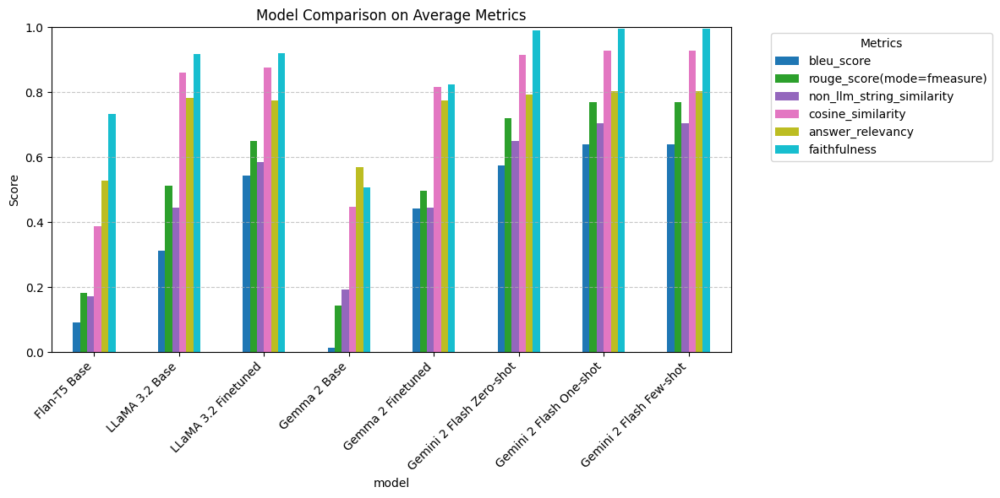

In [ ]:
import matplotlib.pyplot as plt

# Plot
ax = plot_df.plot(kind="bar", figsize=(12, 6), colormap="tab10")
plt.title("Model Comparison on Average Metrics")
plt.ylabel("Score")
plt.ylim(0, 1)
plt.xticks(rotation=45, ha='right')
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.legend(title="Metrics", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

## 📊 Overall metrics Summary

This chart compares multiple language models using six evaluation metrics:

- **BLEU Score** (`bleu_score`) – Measures exact n-gram overlap.
- **ROUGE Score (F-measure)** (`rouge_score(mode=fmeasure)`) – Measures overlap with flexibility in word ordering.
- **Levenshtein Similarity** (`non_llm_string_similarity`) – Based on string edit distance.
- **Cosine Similarity** (`cosine_similarity`) – Semantic similarity between embeddings.
- **Answer Relevancy** (`answer_relevancy`) – How relevant the answer is to the input question.
- **Faithfulness** (`faithfulness`) – Measures factual alignment with the source context.

---

### Key Observations

- **All models** struggled with BLEU and ROUGE initially, due to the **lack of knowledge of the answer format**. Even when answers were faithful, they didn’t always match word-for-word.

- The **one-shot prompting approach** solved this issue for large models like **Gemini 2**, helping them learn answer structure and **boosting BLEU/ROUGE** without harming RAG metrics.

- **Few-shot prompting** did **not provide significant improvement** beyond one-shot for large LLMs, likely because one example was enough to guide these models.

---

### Small Model Insights

- **Gemma 2 (base)** performed poorly out-of-the-box, often returning short or incorrect answers.  
  After **fine-tuning**, it showed major improvements across **faithfulness, relevance, BLEU, and ROUGE**. The short-answer training format helped it learn concise and structured outputs.

- **LLaMA 3.2** showed **strong faithfulness and relevance even without fine-tuning**, but fine-tuning helped **further improve token-level metrics**.

---

### 📋 Summary Table

| Model           | Faithfulness | Answer Relevance | BLEU  | ROUGE | Notes |
|----------------|--------------|------------------|-------|--------|-------|
| Gemini 2 (base) | High         | High             | Low   | Low    | Lacks structure |
| Gemini 2 (1-shot) | High       | High             | High  | High   | One-shot helped formatting |
| Gemini 2 (few-shot) | ≈1-shot  | ≈1-shot          | ≈1-shot | ≈1-shot | No big gain over one-shot |
| Gemma 2 (base)  | Low          | Low              | Low   | Low    | Misses question context |
| Gemma 2 (fine-tuned) | High    | High             | High  | High   | Learned structure + relevance |
| LLaMA 3.2 (base)| Medium–High  | High             | Medium| Medium | Already strong pretrained |
| LLaMA 3.2 (fine-tuned) | High  | High             | High  | High   | Fine-tuning boosted token match |


---

This analysis highlights the importance of **architecture**, **training data**, **moel fine-tuning** and **prompting technique** (zero/one/few-shot) in achieving high-quality model performance across both **semantic** and **factual** dimensions.


---
# 📘 Summarization Model with LoRA and PEFT using FLAN-T5

### 🔍 Objective:
The goal of this notebook is to build a lightweight, instruction-following **summarization model** that generates concise answers from a given **question + context** input.

We fine-tune the **FLAN-T5** model using a **parameter-efficient method** (PEFT) called **LoRA (Low-Rank Adaptation)**. The dataset consists of context-question-answer triples, where the answer serves as a summary of the context in response to the question.

---

### 🛠️ Approach Summary:
- **Model**: `google/flan-t5-base` (pretrained on instruction-following tasks)
- **Task framing**: Instruction-based summarization using `"summarize: "` prefix
- **Data**: `neural-bridge/rag-dataset-12000` (QA-style summarization)
- **Fine-tuning**: We apply **LoRA adapters** to inject trainable parameters without updating the full model
- **Training Framework**: `adapter-transformers` + HuggingFace Trainer

---

### 🧠 What is LoRA?

**LoRA (Low-Rank Adaptation)** is a technique for fine-tuning large language models by **inserting trainable rank-decomposed matrices** into each layer, while **keeping the original weights frozen**.

Instead of updating the full weight matrix $W \in \mathbb{R}^{d \times d}$ , LoRA approximates the update as:

$$
\Delta W \approx A B \quad \text{where } A \in \mathbb{R}^{d \times r}, \; B \in \mathbb{R}^{r \times d}, \; r \ll d
$$

This drastically reduces the number of trainable parameters and allows efficient adaptation with less compute and memory.

---

### 🧩 What is PEFT?

**PEFT (Parameter-Efficient Fine-Tuning)** refers to any technique that fine-tunes only a **subset of a model's parameters**.  
LoRA is one such method under this umbrella, making it possible to:
- Reuse the same base model across tasks
- Add/remove adapters without retraining
- Reduce storage and deployment cost

---

### ⚡ Why This Setup?

Fine-tuning large models like FLAN-T5 from scratch is expensive and often unnecessary.  
LoRA + PEFT lets us train compact and effective models even on modest hardware, making this setup ideal for:
- Domain adaptation
- Instruction tuning
- Fast experimentation

## 1. Load Tokenizer

We load the tokenizer for the FLAN-T5 base model.  
This tokenizer will be used for encoding inputs (question + context) and decoding model outputs (answers).

In [ ]:
from transformers import AutoTokenizer

base_model = "google/flan-t5-base"

tokenizer = AutoTokenizer.from_pretrained(base_model)
prefix = 'summarize: '

## 2. Define Tokenization Function

This function encodes a batch of data:
- Inputs are created by concatenating `question` + `context`, prefixed with `"summarize: "`.
- Targets are the `answer` texts.
- Both are tokenized with truncation and padding.
- The result is returned as a dictionary with `input_ids` and `labels`.


In [ ]:
def encode_batch(examples):
    text_column1 = 'context'
    text_column2 = 'question'
    summary_column = 'answer'

    padding = "max_length"

    inputs, targets = [], []
    for i in range(len(examples[text_column1])):
        if examples[text_column1][i] and examples[text_column2][i] and examples[summary_column][i]:
            # Concatenate question + context
            input_text = examples[text_column2][i] + " " + examples[text_column1][i]
            inputs.append(input_text)
            targets.append(examples[summary_column][i])


    inputs = [prefix + inp for inp in inputs]

    model_inputs = tokenizer(inputs, max_length=512, padding=padding, truncation=True)
    labels = tokenizer(targets, max_length=128, padding=padding, truncation=True)

    model_inputs["labels"] = labels["input_ids"]
    return model_inputs

## 3. Load and Prepare Dataset

This function loads the dataset split (`train` or `test`) and:
- Filters out rows with missing `context` or `answer`
- Limits the number of rows to `max_items`
- Applies tokenization using `encode_batch`
- Formats the dataset as PyTorch tensors for training


In [ ]:
def load_split(split_name, max_items):

    dataset = load_dataset("neural-bridge/rag-dataset-12000")[split_name]


    dataset = dataset.filter(lambda example: example['context'] is not None and example['answer'] is not None)

    dataset = dataset.filter(lambda _, idx: idx < max_items, with_indices=True)


    dataset = dataset.map(
        encode_batch,
        batched=True,
        remove_columns=dataset.column_names,
        desc="Running tokenizer on " + split_name + " dataset",
    )

    dataset.set_format(type="torch", columns=["input_ids", "labels"])

    return dataset

## 4. Load Model and Add LoRA Adapter

We use the AdapterHub-compatible model (`AutoAdapterModel`) and apply **LoRA (Low-Rank Adaptation)**:
- `r = 8`: Low-rank dimensionality
- `alpha = 16`: Scaling factor
- `intermediate_lora` and `output_lora`: Apply LoRA to both FFN and output layers

This enables **parameter-efficient fine-tuning** without updating the entire base model.


In [ ]:
#from transformers import AutoModelForSeq2SeqLM
from adapters import LoRAConfig

from adapters import AutoAdapterModel

model = AutoAdapterModel.from_pretrained(base_model)

# Load the model
#model = AutoModelForSeq2SeqLM.from_pretrained(base_model)

config = LoRAConfig(
    r=8,
    alpha=16,
    intermediate_lora=True,
    output_lora=True
)


In [ ]:
print(type(model))

<class 'adapters.models.t5.adapter_model.T5AdapterModel'>


In [ ]:
#model.add_adapter("my_summary_adapter", config=config, adapter_type="lora")
model.add_adapter(adapter_name="my_summary_adapter", config=config)

model.train_adapter("my_summary_adapter")
model.set_active_adapters("my_summary_adapter")

## 5. Define Training Configuration and Start Training

We configure the trainer using HuggingFace's `TrainingArguments`:
- 2 epochs
- Batch size of 2
- Logging every 50 steps

We use `AdapterTrainer` to train only the adapter layer, leaving the base model frozen.

Training and evaluation are performed on subsets of 1,000 training and 100 test examples.


In [ ]:
from transformers import TrainingArguments
from adapters import AdapterTrainer
from datasets import load_dataset
batch_size = 2

training_args = TrainingArguments(
    learning_rate=3e-4,
    num_train_epochs=2,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    logging_steps=50,
    output_dir="./training_output",
    overwrite_output_dir=True,
    remove_unused_columns=False,
)

trainer = AdapterTrainer(
    model=model,
    args=training_args,
    tokenizer=tokenizer,
    train_dataset=load_split("train", 1000),
    eval_dataset=load_split("test", 100),
)

trainer.train()


Running tokenizer on train dataset:   0%|          | 0/1000 [00:00<?, ? examples/s]

Running tokenizer on test dataset:   0%|          | 0/100 [00:00<?, ? examples/s]

Passing a tuple of `past_key_values` is deprecated and will be removed in Transformers v4.48.0. You should pass an instance of `EncoderDecoderCache` instead, e.g. `past_key_values=EncoderDecoderCache.from_legacy_cache(past_key_values)`.


Step,Training Loss
50,23.355300
100,5.437000
150,2.837900
200,1.171000
250,0.583200
300,0.565700
350,0.546600
400,0.631200
450,0.528300
500,0.455200


Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.
Trainer.tokenizer is now deprecated. You should use Trainer.processing_class instead.


TrainOutput(global_step=1000, training_loss=2.037519121170044, metrics={'train_runtime': 387.6525, 'train_samples_per_second': 5.159, 'train_steps_per_second': 2.58, 'total_flos': 1381594300416000.0, 'train_loss': 2.037519121170044, 'epoch': 2.0})

In [ ]:
trainer.evaluate()

{'eval_loss': 0.38506218791007996,
 'eval_runtime': 6.0071,
 'eval_samples_per_second': 16.647,
 'eval_steps_per_second': 8.324,
 'epoch': 2.0}

## 6. Merge Adapter with Base Model

After training, the adapter is merged into the base model so it can be used for standalone inference without adapter activation.

In [ ]:

model.merge_adapter("my_summary_adapter")

## 7. Run Inference

We test the trained summarization model by passing in a question and a long context.  
The model generates a summary using its learned instruction-following ability.

#### Output:
> **Generated Summary**:  
> *The story of the magic mill spread far and wide.*

This shows the model's ability to extract and compress key information into a brief, high-level summary.


In [ ]:
context = """
Once upon a time, there were two brothers — one was rich, and the other was poor. The poor brother ran out of food and went to his rich brother, begging for something to eat.

The rich brother, not happy about helping, said, “I’ll give you this ham, but you must take it to Dead Man’s Hall.”

Grateful for the food, the poor brother agreed. He walked all day and finally reached a large building at dusk. Outside, an old man was chopping wood.

“Excuse me, sir,” said the poor brother. “Is this the way to Dead Man’s Hall?”

“Yes, you’ve arrived,” replied the old man. “Inside, they will want to buy your ham. But don’t sell it unless they give you the hand-mill that stands behind the door.”

The poor brother thanked the old man, went inside, and everything happened just as the old man had said. The poor brother left with the hand-mill and asked the old man how to use it. Then, he set off home.

The hand-mill was magical. When the poor brother got home, he asked it to grind a feast of food and drink. To stop the mill, he simply had to say, “Thank you, magic mill, you can stop now.”

When the rich brother saw that his brother was no longer poor, he became jealous. “Give me that mill!” he demanded. The poor brother, having everything he needed, agreed to sell it but didn’t tell his rich brother how to stop it.

The rich brother eagerly asked the mill to grind food when he got home, but because he didn’t know how to stop it, the mill kept grinding until food overflowed from the house and across the fields. In a panic, he ran to his poor brother’s house. “Please take it back!” he cried. “If it doesn’t stop, the whole town will be buried!”

The poor brother took the mill back and was never poor or hungry again.

Soon, the story of the magic mill spread far and wide. One day, a sailor knocked at the poor brother’s door. “Does the mill grind salt?” he asked.

“Of course,” replied the brother. “It will grind anything you ask.”

The sailor, eager to stop traveling far for salt, offered a thousand coins for the mill. Though the brother was hesitant, he eventually agreed.

In his hurry, the sailor forgot to ask how to stop the mill. Once at sea, he placed the mill on deck and commanded, “Grind salt, and grind quickly!”

The mill obeyed, but it didn’t stop. The pile of salt grew and grew until the ship sank under its weight.

The mill still lies at the bottom of the sea, grinding salt to this day, and that’s why the sea is salty.

"""
question = "Summarize the story."

input_text = prefix + question + " " + context

inputs = tokenizer(input_text, return_tensors="pt", truncation=True).to(model.device)

output = model.generate(**inputs, max_length=128)

generated_summary = tokenizer.decode(output[0], skip_special_tokens=True)
print("Input:\n", input_text)
print("\nGenerated Summary:\n", generated_summary)


Input:
 summarize: Summarize the story. 
Once upon a time, there were two brothers — one was rich, and the other was poor. The poor brother ran out of food and went to his rich brother, begging for something to eat.

The rich brother, not happy about helping, said, “I’ll give you this ham, but you must take it to Dead Man’s Hall.”

Grateful for the food, the poor brother agreed. He walked all day and finally reached a large building at dusk. Outside, an old man was chopping wood.

“Excuse me, sir,” said the poor brother. “Is this the way to Dead Man’s Hall?”

“Yes, you’ve arrived,” replied the old man. “Inside, they will want to buy your ham. But don’t sell it unless they give you the hand-mill that stands behind the door.”

The poor brother thanked the old man, went inside, and everything happened just as the old man had said. The poor brother left with the hand-mill and asked the old man how to use it. Then, he set off home.

The hand-mill was magical. When the poor brother got home,

# 🎙️ Voice Interactive Chatbot (Offline LLM + Contextual RAG) 🦙

This project is a locally running voice assistant inspired by [this guide](https://medium.com/@vndee.huynh/build-your-own-voice-assistant-and-run-it-locally-whisper-ollama-bark-c80e6f815cba), with full offline support and additional contextual capabilities.

---

## ✨ Features

- ✅ **Fully Local** – No external APIs or internet access required.
- 🎤 **Voice Interface** – Speak directly using your microphone.
- 🧠 **Local LLM** – Powered by [LLaMA 3.2 (1B)](https://ollama.com/library/llama3.2:1b) via [Ollama](https://ollama.com).
- 📚 **Context-Aware Responses** – Uses a dataset and vector similarity (FAISS) to find relevant context for more accurate answers.

---

## 🧠 How It Works

1. Assistant listens to your voice via microphone.
2. Audio is transcribed using OpenAI's `whisper`.
3. The transcribed text is embedded and compared against a local dataset using FAISS.
4. If a relevant match is found, that context is injected into the LLM prompt.
5. The prompt is processed by a locally running LLaMA model.
6. Response is spoken aloud using a local TTS engine (e.g., Bark).

---

## ⚙️ Requirements

- Python 3.11
- [Ollama](https://ollama.com) installed with `llama3.2:1b` pulled (`ollama pull llama3.2:1b`)
- Microphone and speaker (for voice input/output)
- Python packages:
  - `langchain`
  - `langchain-community`
  - `langchain-core`
  - `transformers`
  - `faiss-cpu`
  - `openai-whisper`
  - `numpy`, `scikit-learn`, `rich`, etc.

Install dependencies (example using pip):

```bash
pip install langchain langchain-community langchain-core transformers faiss-cpu openai-whisper numpy scikit-learn rich


In [ ]:
import nltk
import torch
import warnings
import numpy as np
from transformers import AutoProcessor, BarkModel

warnings.filterwarnings(
    "ignore",
    message="torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.",
)


class TextToSpeechService:
    def __init__(self, device: str = "cuda" if torch.cuda.is_available() else "cpu"):
        """
        Initializes the TextToSpeechService class.

        Args:
            device (str, optional): The device to be used for the model, either "cuda" if a GPU is available or "cpu".
            Defaults to "cuda" if available, otherwise "cpu".
        """
        self.device = device
        self.processor = AutoProcessor.from_pretrained("suno/bark-small")
        self.model = BarkModel.from_pretrained("suno/bark-small")
        self.model.to(self.device)

    def synthesize(self, text: str, voice_preset: str = "v2/en_speaker_1"):
        """
        Synthesizes audio from the given text using the specified voice preset.

        Args:
            text (str): The input text to be synthesized.
            voice_preset (str, optional): The voice preset to be used for the synthesis. Defaults to "v2/en_speaker_1".

        Returns:
            tuple: A tuple containing the sample rate and the generated audio array.
        """
        inputs = self.processor(text, voice_preset=voice_preset, return_tensors="pt")
        inputs = {k: v.to(self.device) for k, v in inputs.items()}

        with torch.no_grad():
            audio_array = self.model.generate(**inputs, pad_token_id=10000)

        audio_array = audio_array.cpu().numpy().squeeze()
        sample_rate = self.model.generation_config.sample_rate
        return sample_rate, audio_array

    def long_form_synthesize(self, text: str, voice_preset: str = "v2/en_speaker_1"):
        """
        Synthesizes audio from the given long-form text using the specified voice preset.

        Args:
            text (str): The input text to be synthesized.
            voice_preset (str, optional): The voice preset to be used for the synthesis. Defaults to "v2/en_speaker_1".

        Returns:
            tuple: A tuple containing the sample rate and the generated audio array.
        """
        pieces = []
        sentences = nltk.sent_tokenize(text)
        silence = np.zeros(int(0.25 * self.model.generation_config.sample_rate))

        for sent in sentences:
            sample_rate, audio_array = self.synthesize(sent, voice_preset)
            pieces += [audio_array, silence.copy()]

        return self.model.generation_config.sample_rate, np.concatenate(pieces)

In [ ]:
import requests
import sys
import time
import threading
import numpy as np
import whisper
import sounddevice as sd
from queue import Queue
from rich.console import Console
import langchain
from langchain.memory import ConversationBufferMemory
from langchain.chains import ConversationChain
from langchain.prompts import PromptTemplate
from langchain_community.llms import Ollama
from tts import TextToSpeechService

import faiss
from datasets import load_dataset
from sklearn.preprocessing import normalize
from langchain_community.vectorstores import FAISS
from langchain_community.embeddings import HuggingFaceEmbeddings
from langchain.docstore.document import Document
from langchain_community.docstore.in_memory import InMemoryDocstore

console = Console()
stt = whisper.load_model("base.en")
tts = TextToSpeechService()

template = """
    You are a helpful and friendly AI assistant. You are polite, respectful, and aim to provide concise responses of less
    than 20 words.

    The conversation transcript is as follows:
    {history}

    And here is the user's follow-up: {input}

    Your response:
"""
PROMPT = PromptTemplate(input_variables=["history", "input"], template=template)
chain = ConversationChain(
    prompt=PROMPT,
    verbose=False,
    memory=ConversationBufferMemory(ai_prefix="Assistant:"),
    llm=Ollama(model="llama3.2:1b"),
)

QUESTION_CONTEXT_SIM_TH = 0.5


def check_ollama_server(host="http://localhost:11434"):
    """
    Checks if the Ollama server is running by sending a GET request to the /api/tags endpoint.

    Args:
        host (str): The base URL of the Ollama server.

    Returns:
        bool: True if the server is running, False otherwise.
    """
    try:
        response = requests.get(f"{host}/api/tags", timeout=2)
        if response.status_code == 200:
            return True
        else:
            console.print(f"[red]Unexpected status from Ollama server: {response.status_code}")
            return False
    except requests.exceptions.RequestException as e:
        console.print(f"[red]Ollama server is not running or unreachable at {host}")
        console.print(f"[red]Error: {e}")
        return False


def record_audio(stop_event, data_queue):
    """
    Captures audio data from the user's microphone and adds it to a queue for further processing.

    Args:
        stop_event (threading.Event): An event that, when set, signals the function to stop recording.
        data_queue (queue.Queue): A queue to which the recorded audio data will be added.

    Returns:
        None
    """
    def callback(indata, frames, time, status):
        if status:
            console.print(status)
        data_queue.put(bytes(indata))

    with sd.RawInputStream(
        samplerate=16000, dtype="int16", channels=1, callback=callback
    ):
        while not stop_event.is_set():
            time.sleep(0.1)


def transcribe(audio_np: np.ndarray) -> str:
    """
    Transcribes the given audio data using the Whisper speech recognition model.

    Args:
        audio_np (numpy.ndarray): The audio data to be transcribed.

    Returns:
        str: The transcribed text.
    """
    result = stt.transcribe(audio_np, fp16=False)  # Set fp16=True if using a GPU
    text = result["text"].strip()
    return text


def get_llm_response(text: str) -> str:
    """
    Generates a response to the given text using the Llama-2 language model.

    Args:
        text (str): The input text to be processed.

    Returns:
        str: The generated response.
    """
    response = chain.predict(input=text)
    if response.startswith("Assistant:"):
        response = response[len("Assistant:") :].strip()
    return response


def play_audio(sample_rate, audio_array):
    """
    Plays the given audio data using the sounddevice library.

    Args:
        sample_rate (int): The sample rate of the audio data.
        audio_array (numpy.ndarray): The audio data to be played.

    Returns:
        None
    """
    sd.play(audio_array, sample_rate)
    sd.wait()


def get_context_embeddings(dataset) -> FAISS:
    """
    Compute embeddings for contexts, and return them in vectorstore
    :param dataset: train/test dataset
        :return: langchain_community.vectorstores.faiss.FAISS
    """
    texts = [sample["context"] for sample in dataset]
    documents = [Document(page_content=text) for text in texts]

    embedding_model = HuggingFaceEmbeddings()
    embeddings = [embedding_model.embed_query(doc.page_content) for doc in documents]

    # Normalise for cosine similarity
    normalized_embeddings = normalize(embeddings)

    # FAISS IndexFlatIP (inner product)
    dimension = len(normalized_embeddings[0])
    index = faiss.IndexFlatIP(dimension)
    index.add(np.array(normalized_embeddings))

    # FAISS vectorstore
    vectorstore = FAISS(embedding_function=embedding_model, index=index, docstore=None, index_to_docstore_id=None)

    # Connect documents
    docstore = InMemoryDocstore(dict(enumerate(documents)))
    vectorstore.docstore = docstore
    vectorstore.index_to_docstore_id = dict(enumerate(range(len(documents))))

    return vectorstore


if __name__ == "__main__":
    ds = load_dataset("neural-bridge/rag-dataset-12000")['test'] # computing embeddings for train too heavy

    console.print("[cyan]Assistant starting...")

    if not check_ollama_server():
        console.print("[red]Please start the Ollama server by running 'ollama serve'")
        sys.exit(1)

    console.print("[cyan]Assistant ready! Press Ctrl+C to exit.")

    vectorstore = get_context_embeddings(ds)

    try:
        while True:
            console.input(
                "Press Enter to start recording, then press Enter again to stop."
            )

            data_queue = Queue()  # type: ignore[var-annotated]
            stop_event = threading.Event()
            recording_thread = threading.Thread(
                target=record_audio,
                args=(stop_event, data_queue),
            )
            recording_thread.start()

            input()
            stop_event.set()
            recording_thread.join()

            audio_data = b"".join(list(data_queue.queue))
            audio_np = (
                np.frombuffer(audio_data, dtype=np.int16).astype(np.float32) / 32768.0
            )

            if audio_np.size > 0:
                with console.status("Transcribing...", spinner="earth"):
                    text = transcribe(audio_np)
                console.print(f"[yellow]You: {text}")

                # Find relevant context
                with console.status("Searching for relevant context...", spinner="earth"):
                    document, score = vectorstore.similarity_search_with_score(text, k=1)[0]
                    if score >= QUESTION_CONTEXT_SIM_TH:
                        console.print(f"[green]Found helpful context: {document.page_content}")
                        # Add context to the prompt template
                        text = f"{text}\n\nContext: {document.page_content}"

                with console.status("Generating response...", spinner="earth"):
                    response = get_llm_response(text)
                    sample_rate, audio_array = tts.long_form_synthesize(response)

                console.print(f"[cyan]Assistant: {response}")
                play_audio(sample_rate, audio_array)
            else:
                console.print(
                    "[red]No audio recorded. Please ensure your microphone is working."
                )

    except KeyboardInterrupt:
        console.print("\n[red]Exiting...")

    console.print("[blue]Session ended.")